# Localized Exploratory Analysis

This exploratory analysis was done with the purpose of understanding the behavior of the meteorological variables with the Dengue variables in a specific municipality. It is worth noting that the files read in this notebook have already been preprocessed. And this notebook is designed to receive any municipality and run the analysis for the given municipality without much change to the code.

In [11]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle
import seaborn as sns
sns.set_style("ticks")
import pandas as pd
from datetime import datetime
import glob
import re
import os
from os import walk
# plt.rcParams["font.family"] = "Helvetica"
plt.rcParams.update({'font.size': 12})

In [2]:
path = f'local/data/'
dataframes = {}
files = []
for (dirpath, dirnames, filenames) in walk(path):
    files.extend(filenames)
    break
for f in files:
    name = re.findall("^[a-z]*", f)[0]
    dataframes[name] =  pd.read_csv("local/data/{}".format(f), index_col = 0, parse_dates= True)

In [3]:
# dataframes['barranquilla']

In [4]:
# df = pd.read_csv("local/data/villavicencio_consolidado_2007_2020.csv", index_col = 0, parse_dates= True)

In [5]:
# df.columns

In [6]:
municipality = "Villavicencio"
municipios = list(set(dataframes))

# TEMPERATURE PLOTS

We evaluate temperature over the years in the six cities. For this purpose, we also visualize the maximum and minimum temperature. 

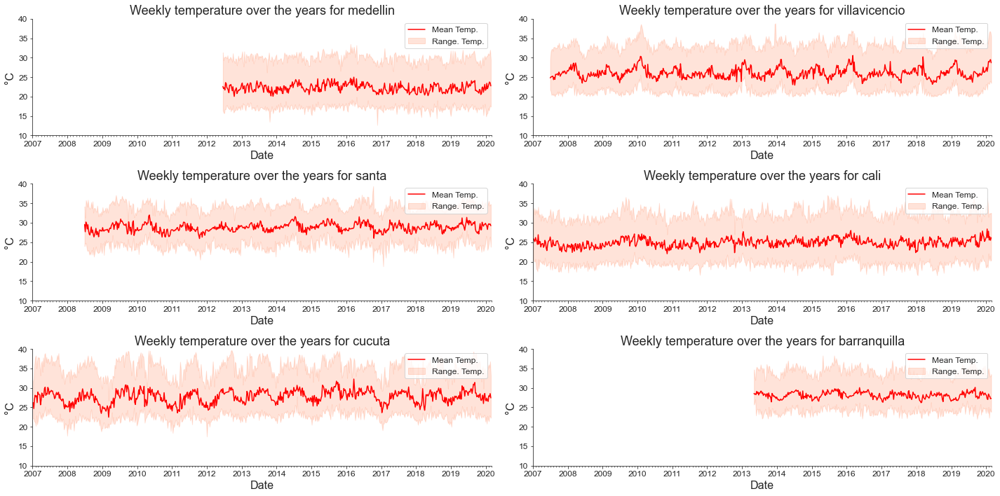

In [38]:
fig, ax = plt.subplots(3,2, figsize=(20,10))
ax = ax.flatten()
for i,n in enumerate(municipios):
    df = dataframes[n]
    x_array = [df.index]
    y_array = [df["TEMPERATURE_MEAN"], df["TEMPERATURE_AMIN"], df["TEMPERATURE_AMAX"]]
    labels_array = ["Mean Temp.", "Range. Temp."]
    colors = ["red","orangered"]
    title = "Weekly temperature over the years for " + n
    ylabel = "°C"
    xlabel = "Date"
    xlim = (pd.to_datetime("2007-01-01"), pd.to_datetime("2020-03-01"))
    plot_time_series(ax[i], x_array, y_array, labels_array, colors, title,  
                     xlabel, ylabel, xlim, (10, 40), "lineplot", fulldates = True)

fig.tight_layout()
plt.show()

In [45]:
fig, ax = plt.subplots(3,2, figsize=(20,10))
ax = ax.flatten()
for i,n in enumerate(municipios):
    df = dataframes[n]
    x_array = [df.index]
    y_array = [desea
    labels_array = ["Mean Temp.", "Range. Temp."]
    colors = ["red","orangered"]
    title = "Weekly temperature over the years for " + n
    ylabel = "°C"
    xlabel = "Date"
    xlim = (pd.to_datetime("2007-01-01"), pd.to_datetime("2020-03-01"))
    plot_time_series(ax[i], x_array, y_array, labels_array, colors, title,  
                     xlabel, ylabel, xlim, (10, 40), "lineplot", fulldates = True)

fig.tight_layout()
plt.show()

In [46]:
# fig, axes = plt.subplots(1,1, figsize=(12,5), dpi = 150)
# sns.boxplot(x=df.index.month, y=df["TEMPERATURE_MEAN"])
# axes.set_title("Boxplot of monthly mean temperatures for " + municipality)
# axes.set_ylabel("°C")
# axes.set_xlabel("Month")

# HUMIDITY PLOTS

The humidity variable must always looked at in 3 different forms, the maximum, minimum and mean humidity. 

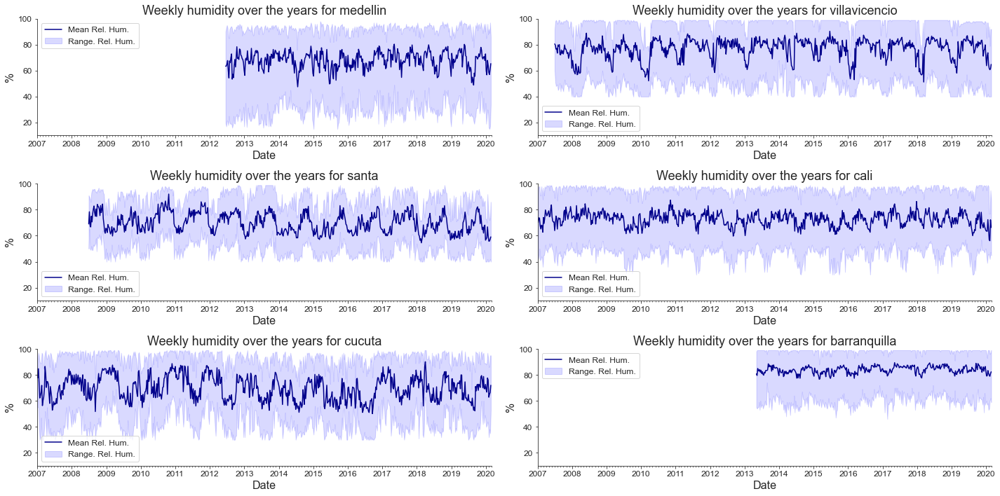

In [39]:
fig, ax = plt.subplots(3,2, figsize=(20,10))
ax = ax.flatten()
for i,n in enumerate(municipios):
    df = dataframes[n]
    x_array = [df.index]
    y_array = [df["REL_HUMIDITY_MEAN"], df["REL_HUMIDITY_AMIN"],df["REL_HUMIDITY_AMAX"] ]
    labels_array = ["Mean Rel. Hum.", "Range. Rel. Hum."]
    title = "Weekly humidity over the years for " + n
    colors = ["darkblue","blue"]
    ylabel = "%"
    xlabel = "Date"
    xlim = (pd.to_datetime("2007-01-01"), pd.to_datetime("2020-03-01"))
    plot_time_series(ax[i], x_array, y_array, labels_array, colors,title,  
                     xlabel, ylabel, xlim, (10,100), "lineplot", fulldates = True)
fig.tight_layout()
plt.show()

In [48]:
# for n in municipios:
#     df = dataframes[n]
#     x_array = [df_filt["ANO"]]*3
#     y_array = [df_filt["REL_HUMIDITY_MEAN"], df_filt["REL_HUMIDITY_AMIN"],df_filt["REL_HUMIDITY_AMAX"] ]
#     labels_array = ["Mean Rel. Hum.", "Min. Rel. Hum.", "Max. Rel. Hum."]
#     title = "Humidity over the years for " + n
#     ylabel = "%"
#     xlabel = "Date"
#     colors = ["forestgreen","darkblue","orangered"]
#     plot_time_series(x_array, y_array, labels_array, colors, title,  xlabel,ylabel, "lineplot", fulldates = False)

In [49]:
# fig, axes = plt.subplots(1,1, figsize=(12,5), dpi = 150)
# sns.boxplot(x=df.index.month, y=df["REL_HUMIDITY_MEAN"])
# axes.set_title("Boxplot of monthly relative humidities for " + municipality)
# axes.set_ylabel("%")
# axes.set_xlabel("Month")

# PRECIPITATION PLOTS

The precipitation variable, due to its nature, must be analyzed as the total precipitation. The maximum and minimums in this variable do not describe the general behavior of the variable.

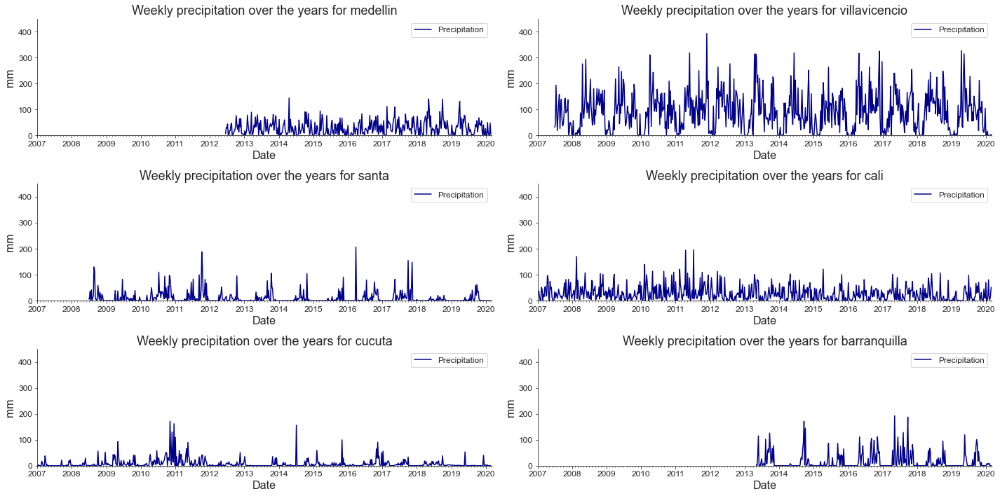

In [40]:
fig, ax = plt.subplots(3,2, figsize=(20,10))
ax = ax.flatten()
for i,n in enumerate(municipios):
    df = dataframes[n]
    x_array = [df.index]
    y_array = [df["PRECIPITATION"]]
    labels_array = ["Precipitation"]
    title = "Weekly precipitation over the years for " + n
    ylabel = "mm"
    xlabel = "Date"
    colors = ["darkblue"]
    xlim = (pd.to_datetime("2007-01-01"), pd.to_datetime("2020-03-01"))
    plot_time_series(ax[i], x_array, y_array, labels_array, colors, title,  
                     xlabel, ylabel, xlim, (0,450), "lineplot", fulldates = True)

fig.tight_layout()
plt.show()

In [66]:
# fig, axes = plt.subplots(1,1, figsize=(12,5), dpi = 150)
# sns.boxplot(x=df.index.month, y=df["PRECIPITATION"])
# axes.set_title("Boxplot of total monthly precipitation for " + municipality)
# axes.set_ylabel("mm")
# axes.set_xlabel("Month")

In [16]:
df.columns

Index(['COD_DPTO', 'COD_MUNICIPIO', 'POBLACION', 'ANO', 'SEMANA',
       'PRECIPITATION', 'DRY_DAYS', 'TEMPERATURE_AMAX', 'REL_HUMIDITY_AMAX',
       'TEMPERATURE_AMIN', 'REL_HUMIDITY_AMIN', 'TEMPERATURE_MEAN',
       'TEMPERATURE_RANGE', 'REL_HUMIDITY_MEAN', 'MEI', 'ONI', 'SST1+2',
       'SST3', 'SST4', 'SST3.4', 'TNI', 'DENGUE', 'DENGUE GRAVE',
       'MORTALIDAD POR DENGUE'],
      dtype='object')

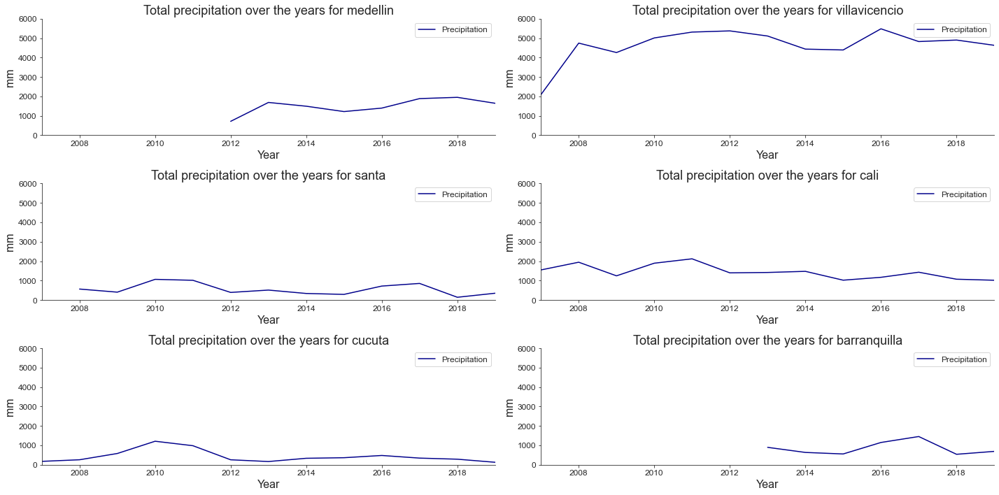

In [47]:
fig, ax = plt.subplots(3,2, figsize=(20,10))
ax = ax.flatten()
for i,n in enumerate(municipios):
    df = dataframes[n]
    df_prec_yearly = df[(df.index.year >= 2007) & (df.index.year <= 2019)]
    df_prec_yearly = df_prec_yearly[["PRECIPITATION","DRY_DAYS"]]
    df_prec_yearly = df_prec_yearly.groupby(df_prec_yearly.index.year).sum()
    x_array = [df_prec_yearly.index]
    y_array = [df_prec_yearly["PRECIPITATION"]]
    labels_array = ["Precipitation"]
    title = "Total precipitation over the years for " + n
    ylabel = "mm"
    xlabel = "Year"
    colors = ["darkblue"]
    xlim = [2007, 2019]
#     xlim = (pd.to_datetime("2007-01-01"), pd.to_datetime("2020-03-01"))
    plot_time_series(ax[i], x_array, y_array, labels_array, colors, title, xlabel,ylabel, xlim ,(0, 6000),"lineplot", fulldates = False)
fig.tight_layout()
plt.show()

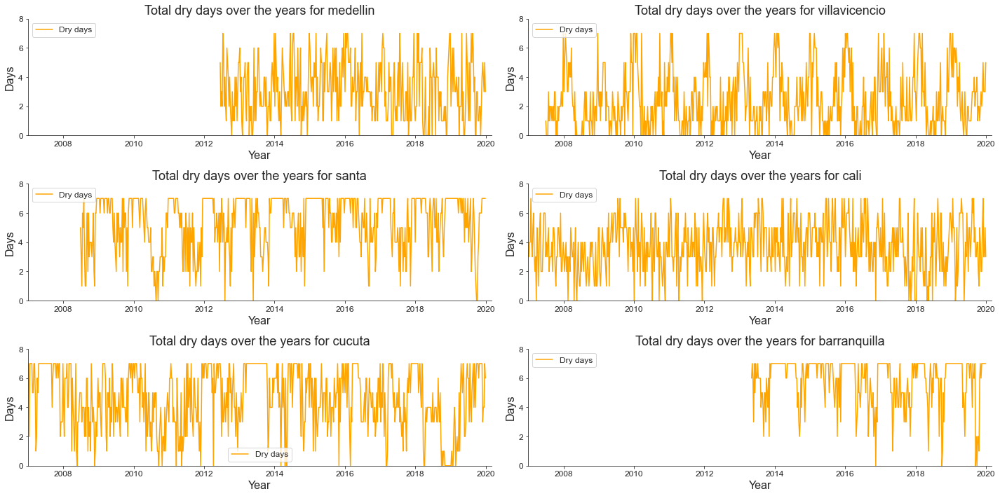

In [44]:
fig, ax = plt.subplots(3,2, figsize=(20,10))
ax = ax.flatten()
for i,n in enumerate(municipios):
    df = dataframes[n]
    df_prec_yearly = df[(df.index.year >= 2007) & (df.index.year <= 2019)]
    x_array = [df_prec_yearly.index]
    y_array = [df_prec_yearly["DRY_DAYS"]]
    labels_array = ["Dry days"]
    title = "Total dry days over the years for " + n
    ylabel = "Days"
    xlabel = "Year"
    colors = ["orange"]
    xlim = (pd.to_datetime("2007-01-01"), pd.to_datetime("2020-03-01"))
    plot_time_series(ax[i], x_array, y_array, labels_array, colors, title, xlabel,ylabel, xlim, (0, 8),"lineplot", fulldates = False)
fig.tight_layout()
plt.show()

# NIÑO PLOTS

The Niño indexes are also very important features to analyze in this project. That is why it is interesting to analyze and understand their behavior in time series plots.

In [19]:
df.columns

Index(['COD_DPTO', 'COD_MUNICIPIO', 'POBLACION', 'ANO', 'SEMANA',
       'PRECIPITATION', 'DRY_DAYS', 'TEMPERATURE_AMAX', 'REL_HUMIDITY_AMAX',
       'TEMPERATURE_AMIN', 'REL_HUMIDITY_AMIN', 'TEMPERATURE_MEAN',
       'TEMPERATURE_RANGE', 'REL_HUMIDITY_MEAN', 'MEI', 'ONI', 'SST1+2',
       'SST3', 'SST4', 'SST3.4', 'TNI', 'DENGUE', 'DENGUE GRAVE',
       'MORTALIDAD POR DENGUE'],
      dtype='object')

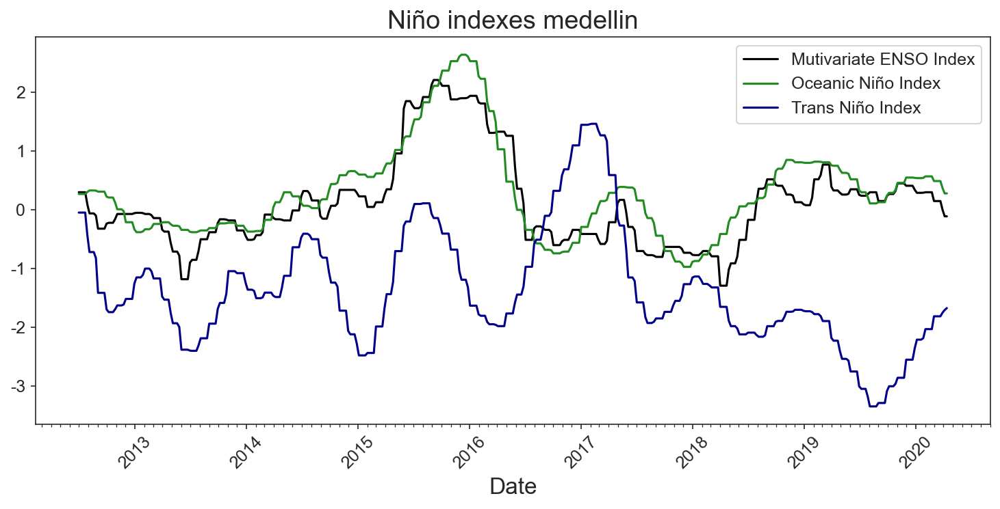

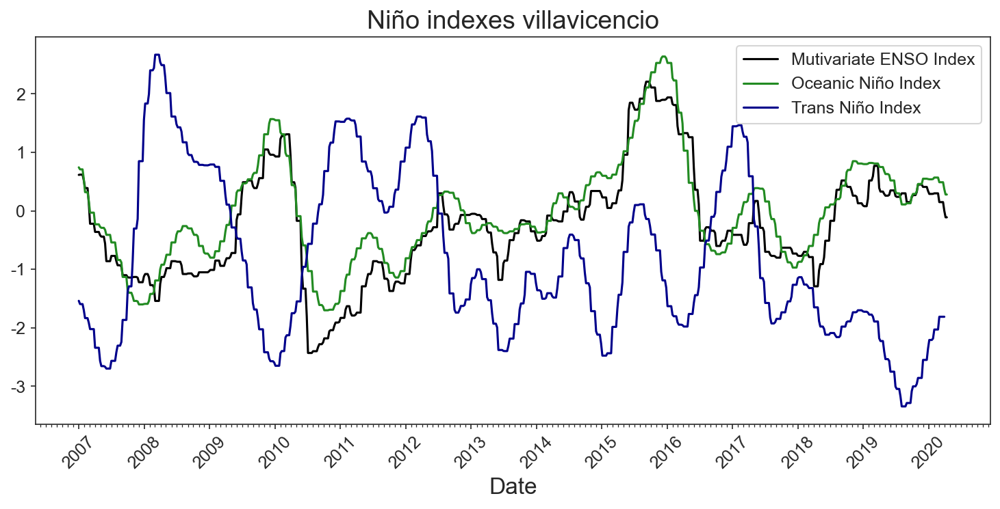

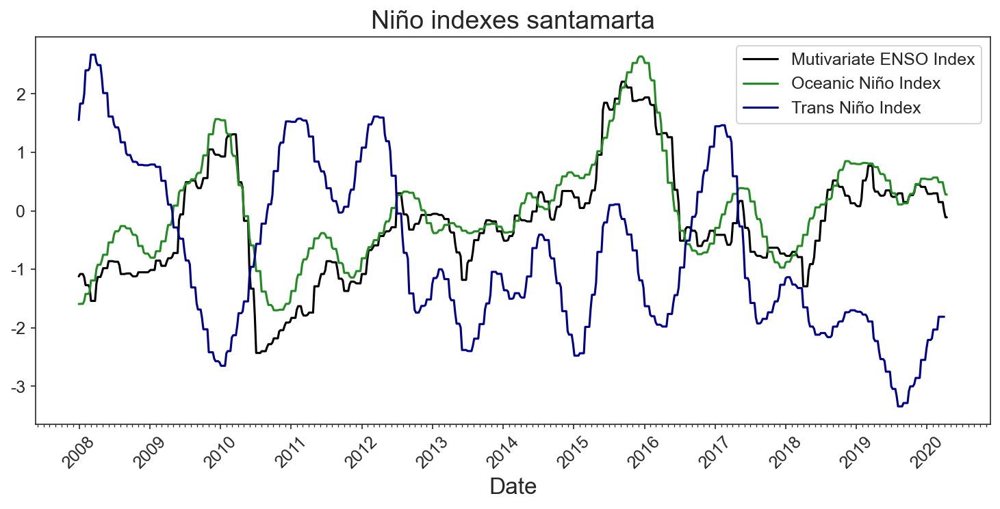

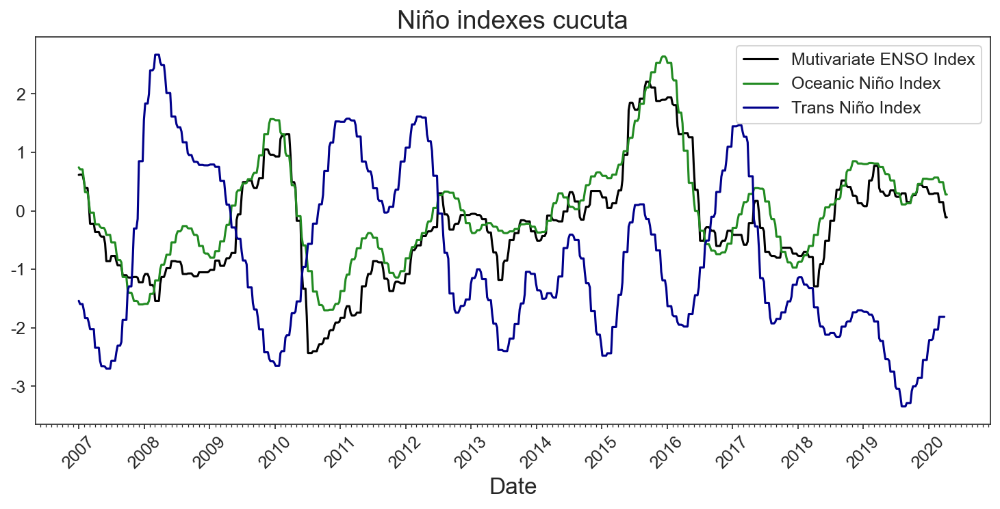

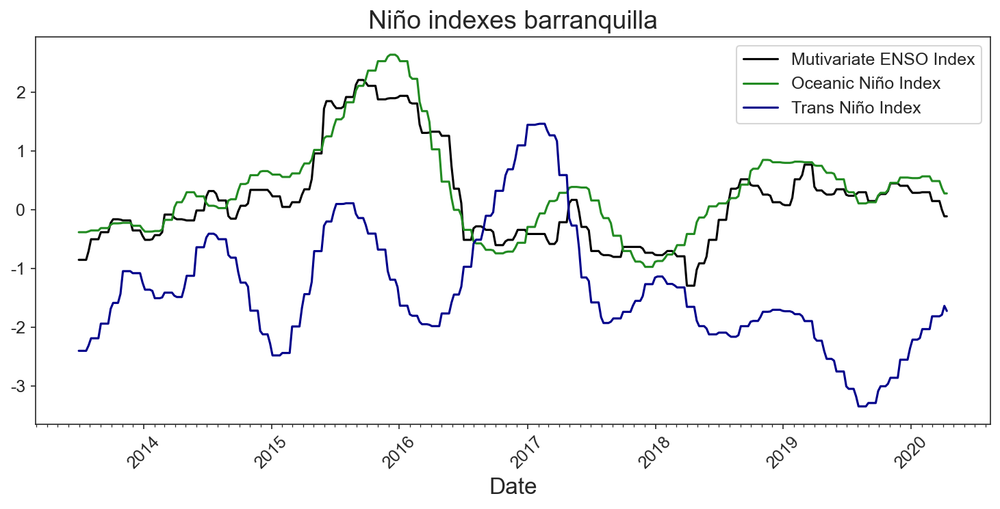

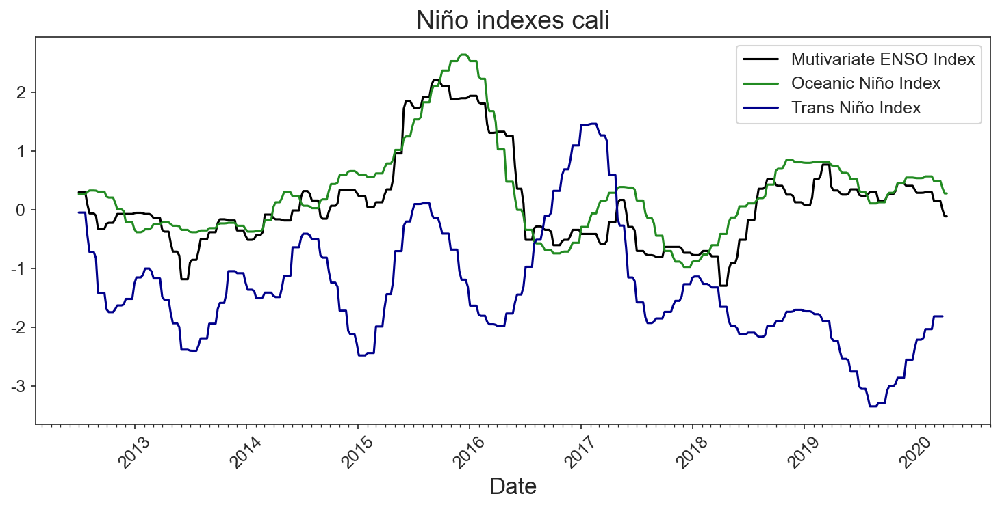

In [20]:
for n in municipios:
    df = dataframes[n]
    x_array = [df.index]*3
    y_array = [df["MEI"], df["ONI"], df["TNI"]]
    labels_array = ["Mutivariate ENSO Index", "Oceanic Niño Index", "Trans Niño Index"]
    colors = ["black","forestgreen","darkblue","orangered","cyan","black"]
    title = "Niño indexes " + n
    ylabel = ""
    xlabel = "Date"
    plot_time_series(x_array, y_array, labels_array,colors,title,  xlabel,ylabel, "lineplot", fulldates = True)

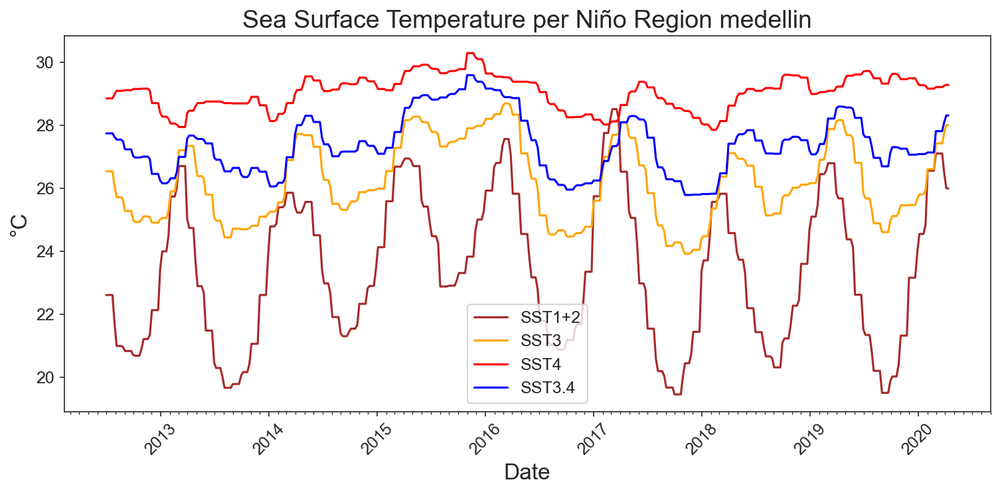

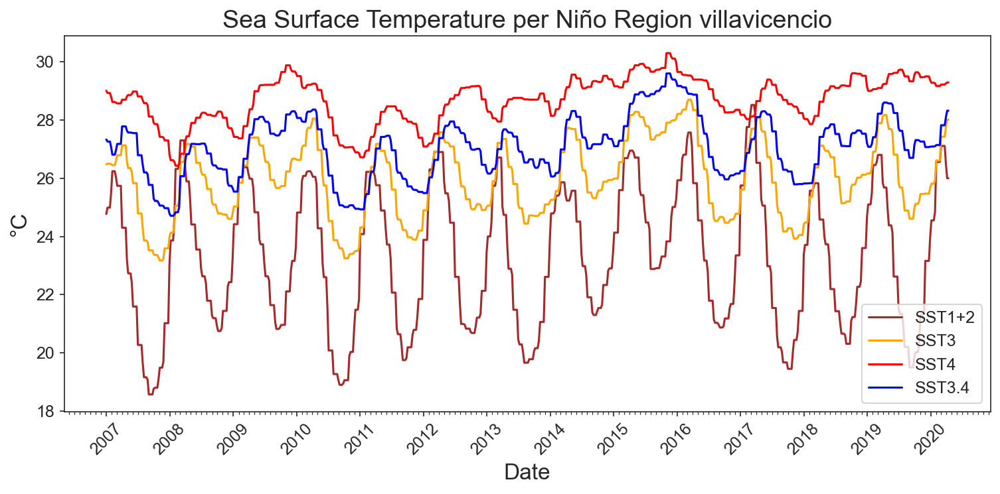

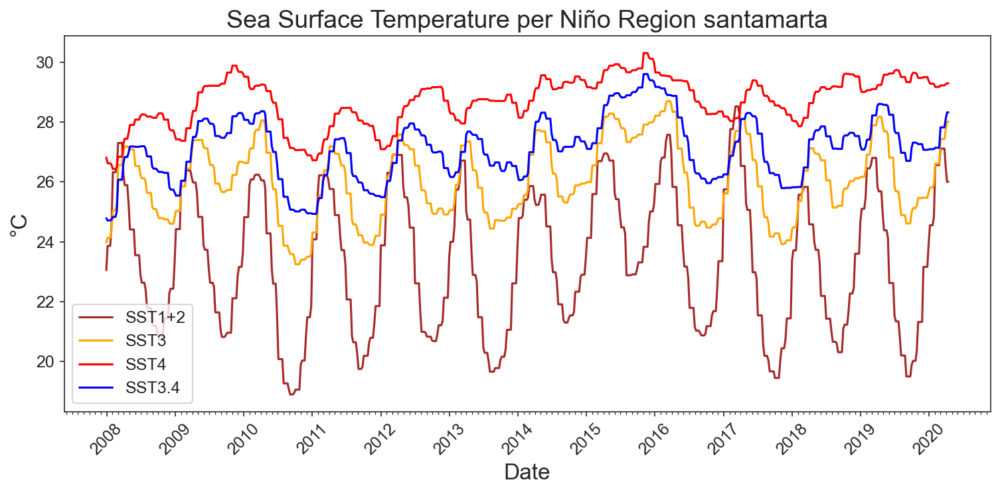

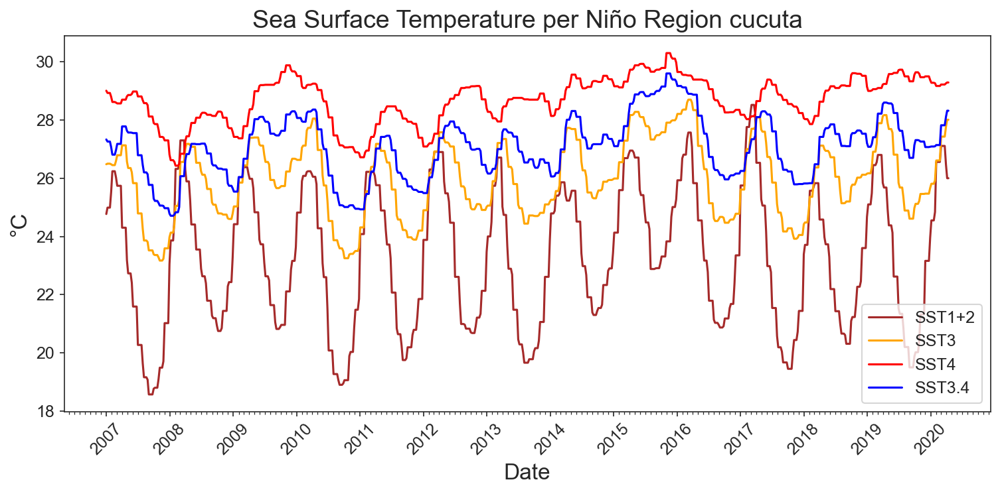

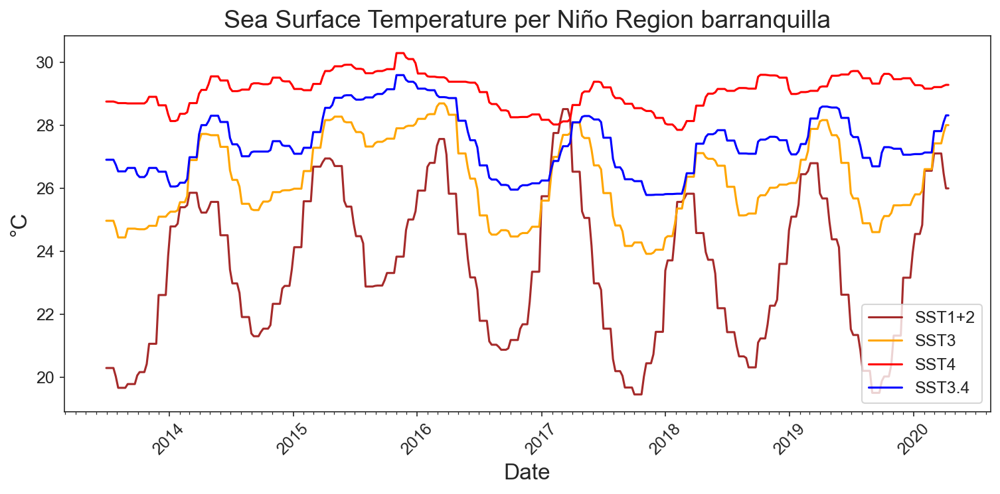

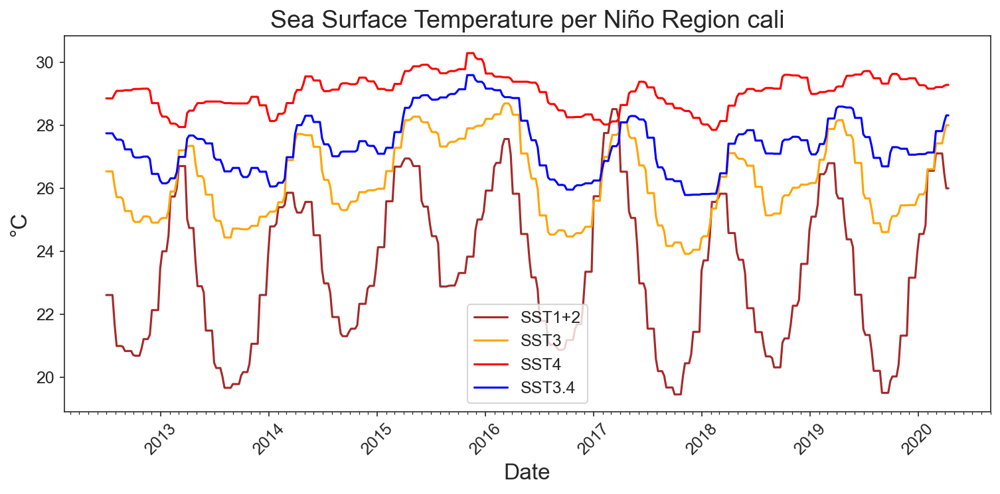

In [21]:
for n in municipios:
    df = dataframes[n]
    x_array = [df.index]*4
    y_array = [df["SST1+2"], df["SST3"], df["SST4"], df["SST3.4"]]
    labels_array = ["SST1+2", "SST3", "SST4", "SST3.4"]
    colors = ["brown","orange","red","blue"]
    title = "Sea Surface Temperature per Niño Region " + n
    ylabel = "°C"
    xlabel = "Date"
    plot_time_series(x_array, y_array, labels_array,colors,title,  xlabel,ylabel, "lineplot", fulldates = True)

# DENGUE PLOTS

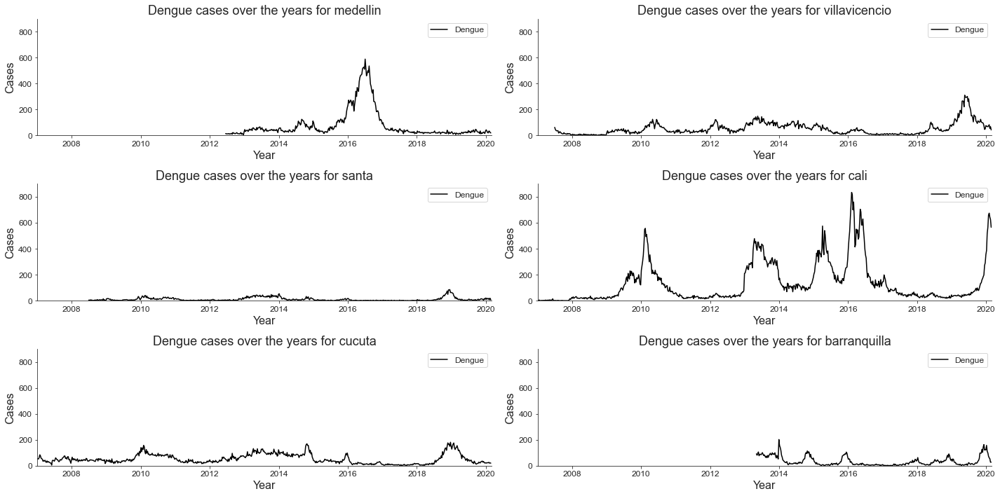

In [55]:
fig, ax = plt.subplots(3,2, figsize=(20,10))
ax = ax.flatten()
for i,n in enumerate(municipios):
    df = dataframes[n]
    x_array = [df.index]
    y_array = [df["DENGUE"]]
    labels_array = ["Dengue"]
    title = "Dengue cases over the years for " + n
    ylabel = "Cases"
    xlabel = "Year"
    colors = ["black"]
    xlim = (pd.to_datetime("2007-01-01"), pd.to_datetime("2020-03-01"))
    plot_time_series(ax[i], x_array, y_array, labels_array, colors, title, xlabel,ylabel, xlim, (0,900),"lineplot", fulldates = False)
fig.tight_layout()
plt.show()

In [54]:
# fig, axes = plt.subplots(1,1, figsize=(12,5), dpi = 150)
# sns.boxplot(x=df.index.month, y=df["DENGUE"])
# axes.set_title("Boxplot of monthly Dengue cases for " + municipality)
# axes.set_ylabel("cases")
# axes.set_xlabel("Month")

## BOXPLOTS FOR UNDERSTANDING THE BEHAVOIR OF EACH VARIABLE THROUGH TIME

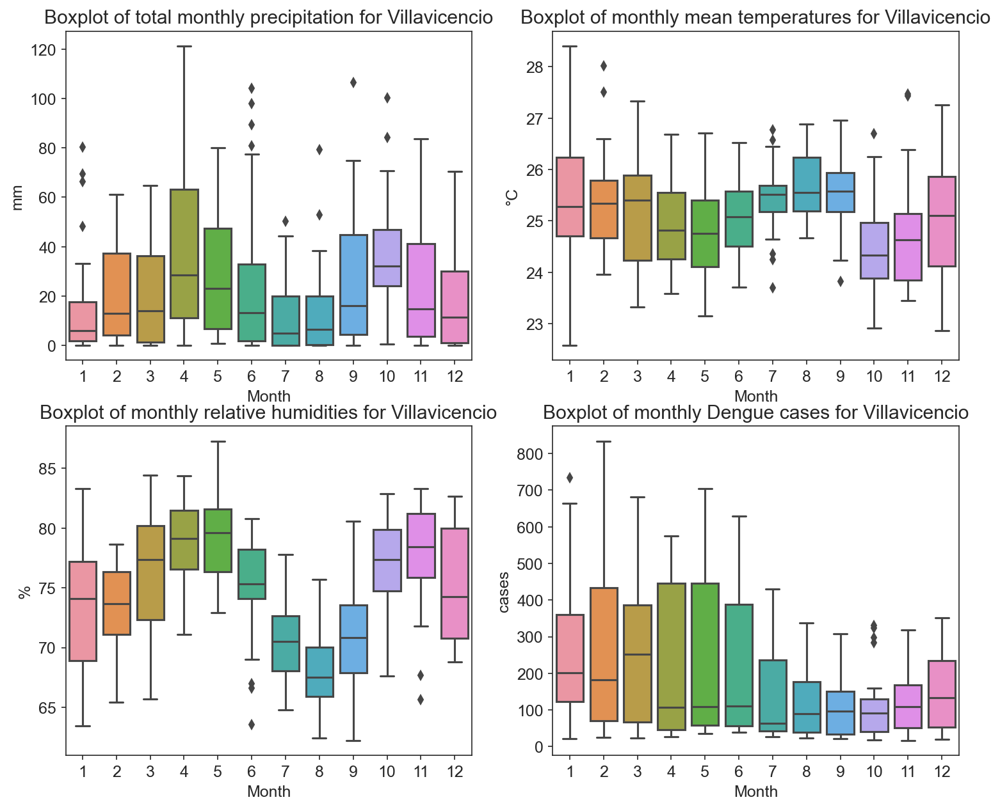

In [24]:
cols = ['PRECIPITATION', 'TEMPERATURE_MEAN', 'REL_HUMIDITY_MEAN', 'DENGUE']
titles = ["Boxplot of total monthly precipitation for ", 
          "Boxplot of monthly mean temperatures for ",
          "Boxplot of monthly relative humidities for ",
          "Boxplot of monthly Dengue cases for "]
ylables = ['mm', '°C', '%', 'cases']

fig, ax = plt.subplots(figsize=(12, 10), dpi = 150)

for i, col in enumerate(cols):
    plt.subplot(2,2, i+1)
    sns.boxplot(x=df.index.month, y=df[col]).set_title(titles[i] + municipality)
    plt.ylabel(ylables[i])
    plt.xlabel("Month")

# SIMPLE CORRELATION BETWEEN ALL VARIABLES

Some of the variables do not have to be in the correlation matrix. That's why they are removed from the beginning.

<ipython-input-25-279af202b13d>:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  corrMatrix = corrMatrix.where(np.tril(np.ones(corrMatrix.shape)).astype(np.bool))


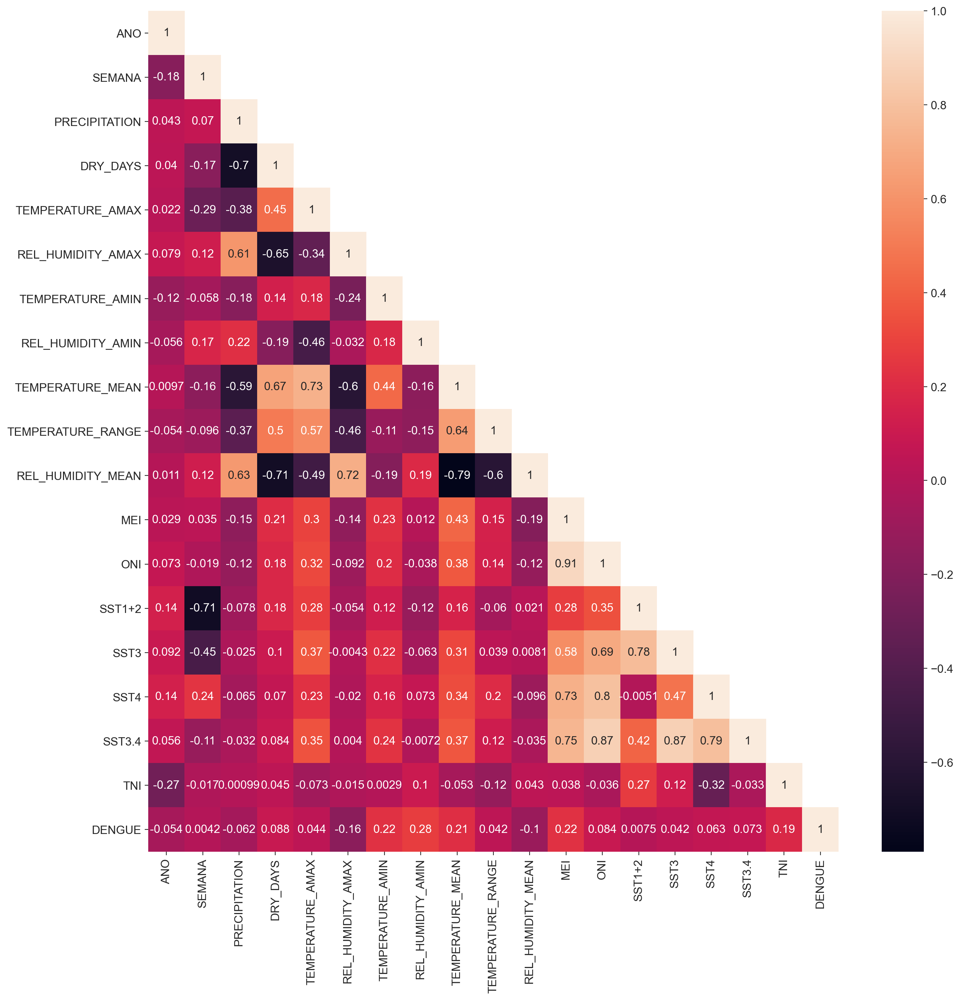

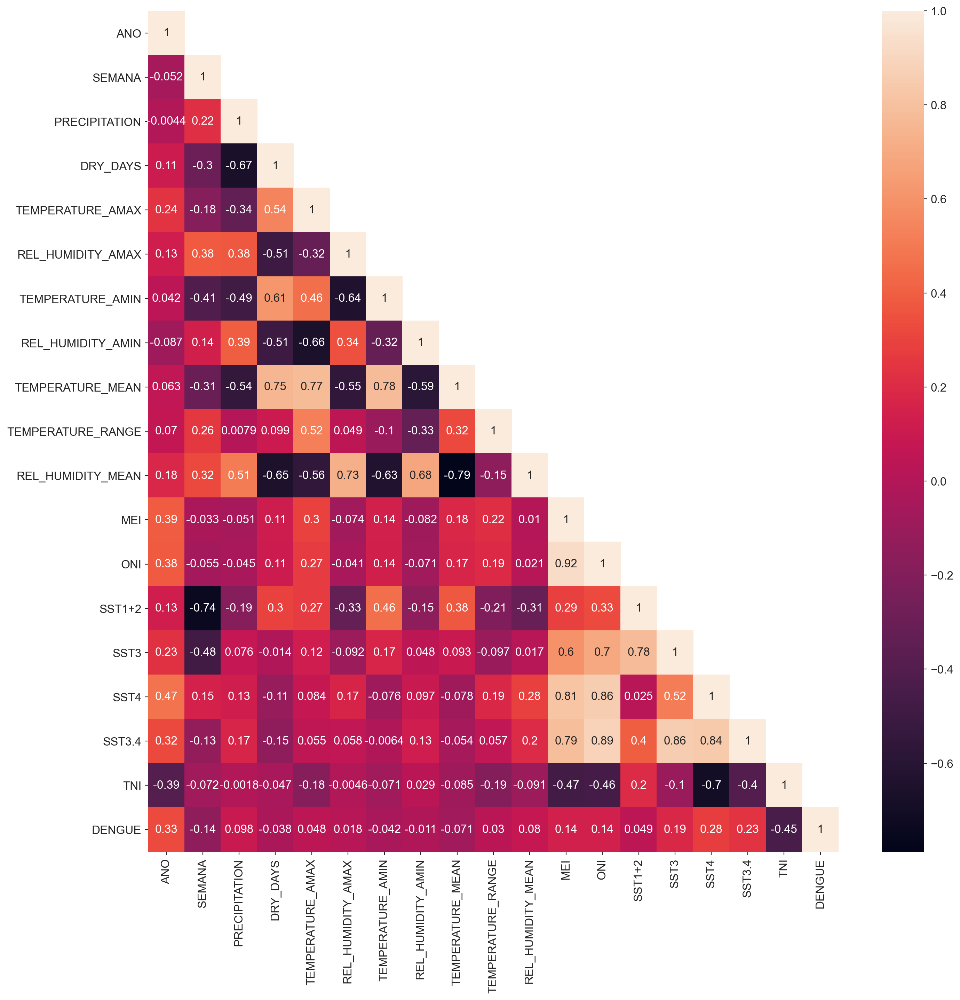

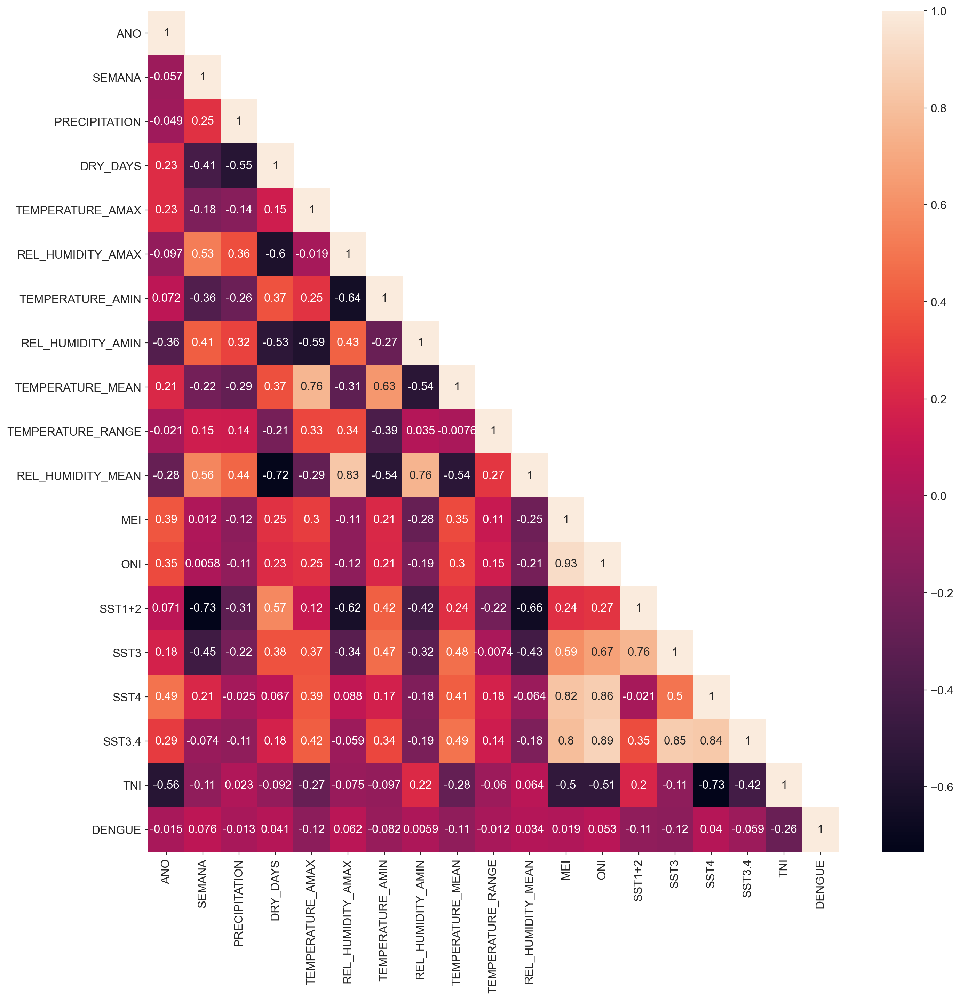

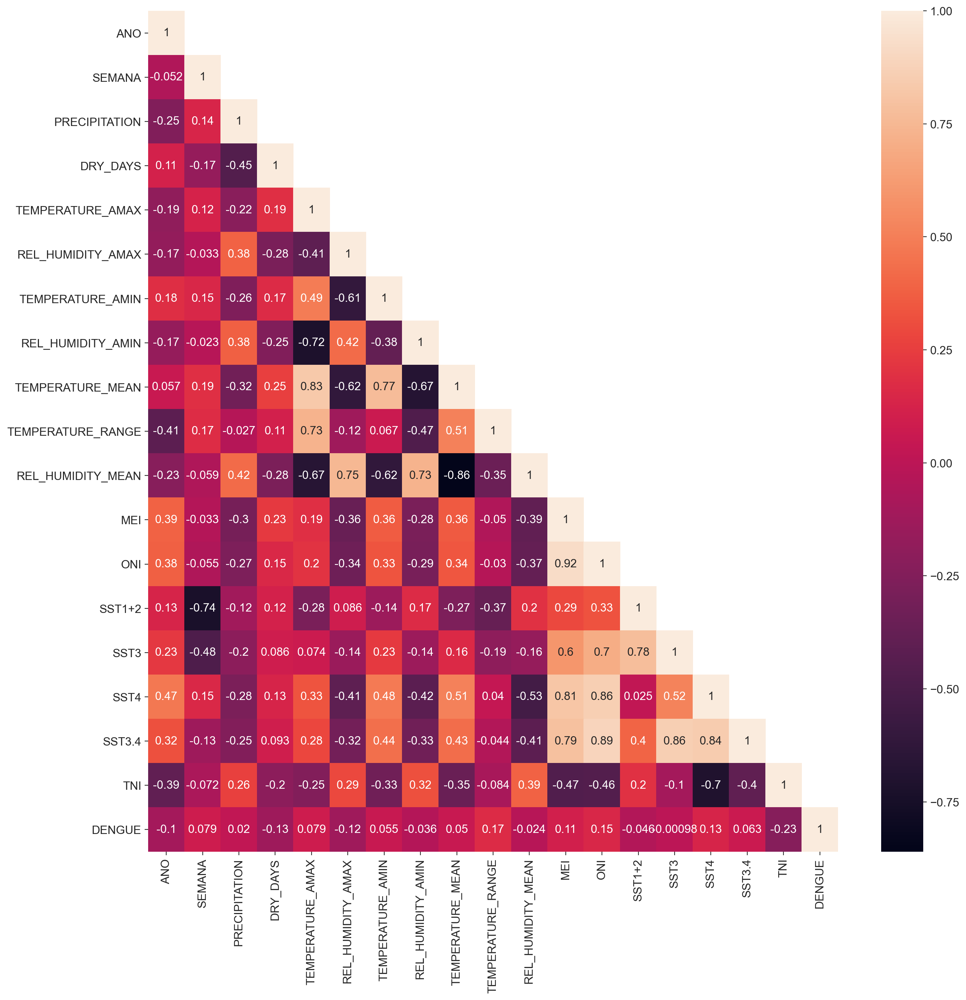

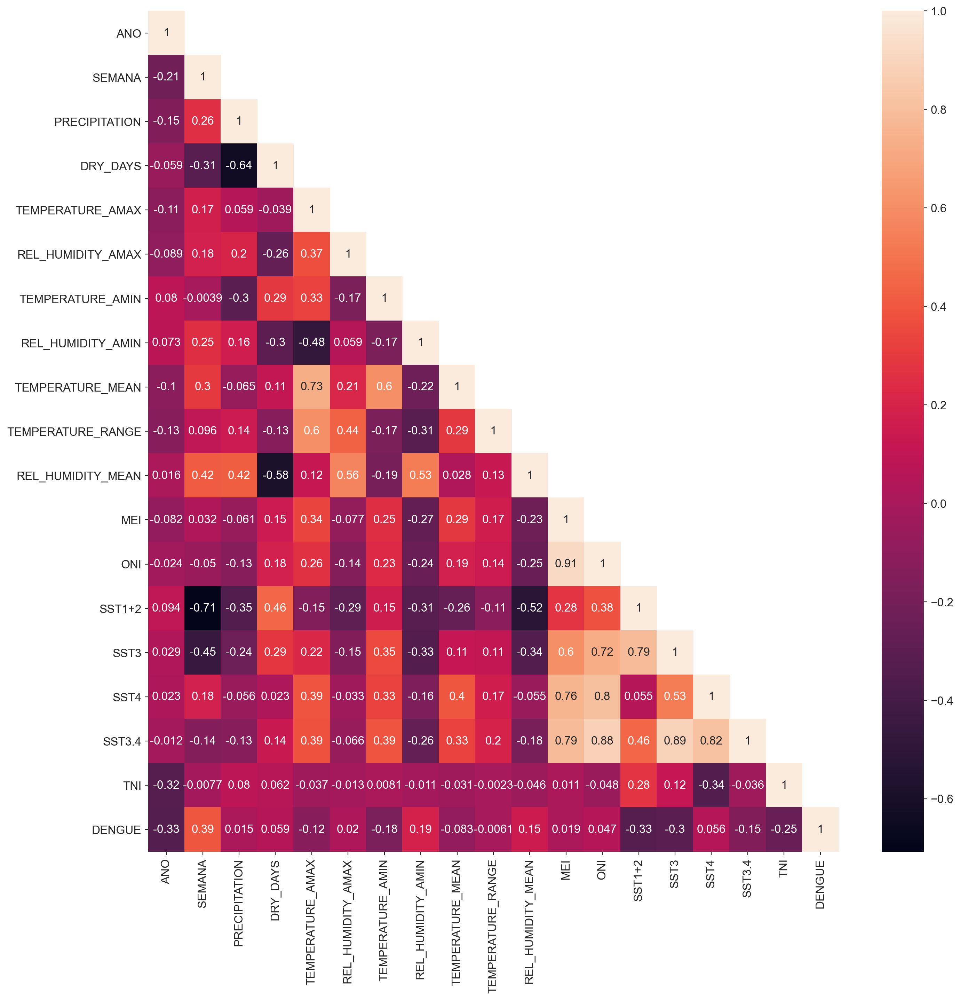

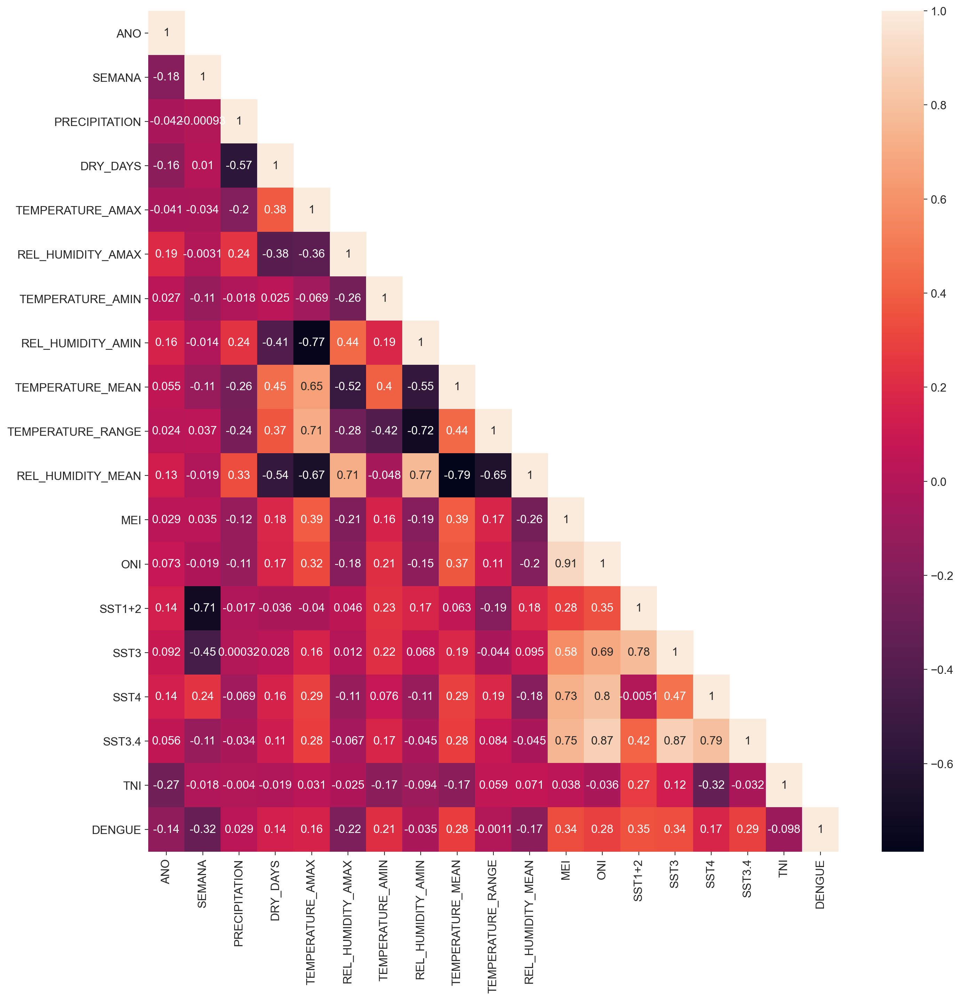

In [25]:
df_for_corr = {}
for n in municipios:
    df = dataframes[n]
    df_for_corr[n] = df.drop(columns=['COD_DPTO',"COD_MUNICIPIO","POBLACION", "DENGUE GRAVE","MORTALIDAD POR DENGUE"])
    fig, axs = plt.subplots(1,figsize=(16,16), dpi = 200)
    corrMatrix = df_for_corr[n].corr()
    corrMatrix = corrMatrix.where(np.tril(np.ones(corrMatrix.shape)).astype(np.bool))
    sns.heatmap(corrMatrix, annot=True)
    plt.show()

We see that some variables are quite correlated, so we could remove some of these. Interestingly, despite being the closest to Cali the SST for Region 1+2 has the weakest correlation with Dengue cases.

From the correlation matrix we see that variables such as: mean temperature, MEI, ONI, SST4, SST3.4 and TNI are the most correlated with the number of Dengue cases.

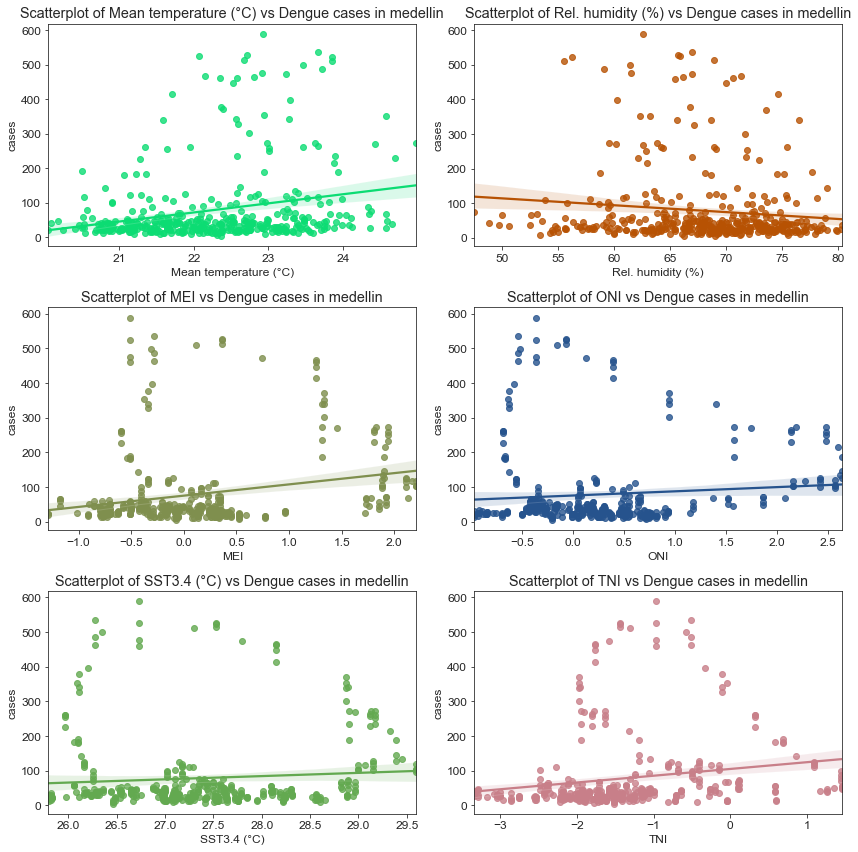

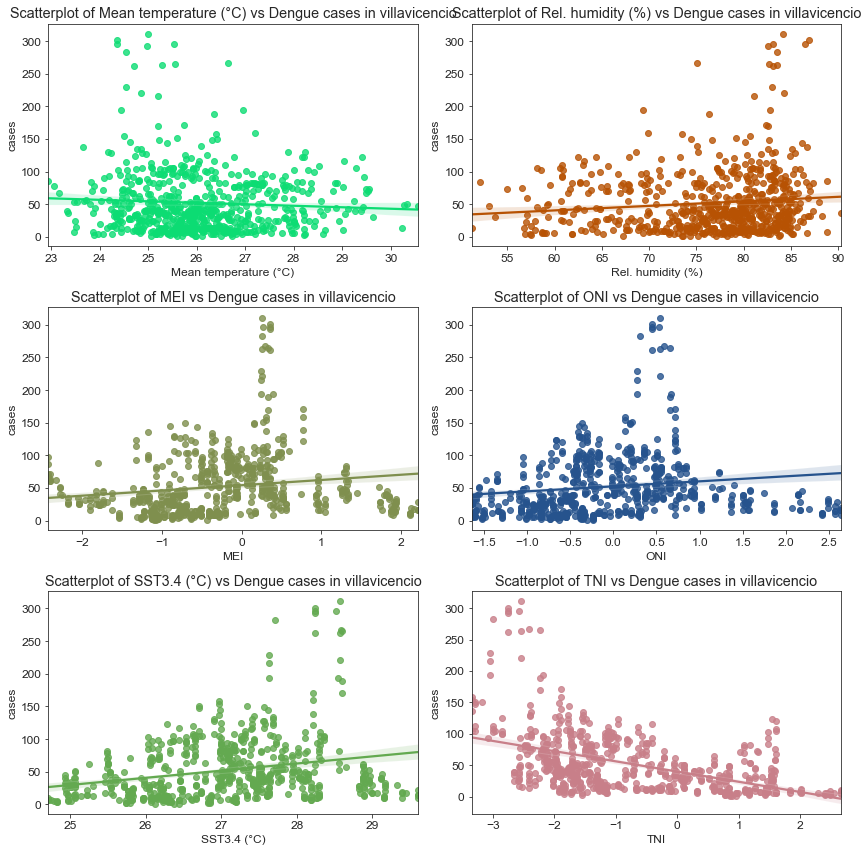

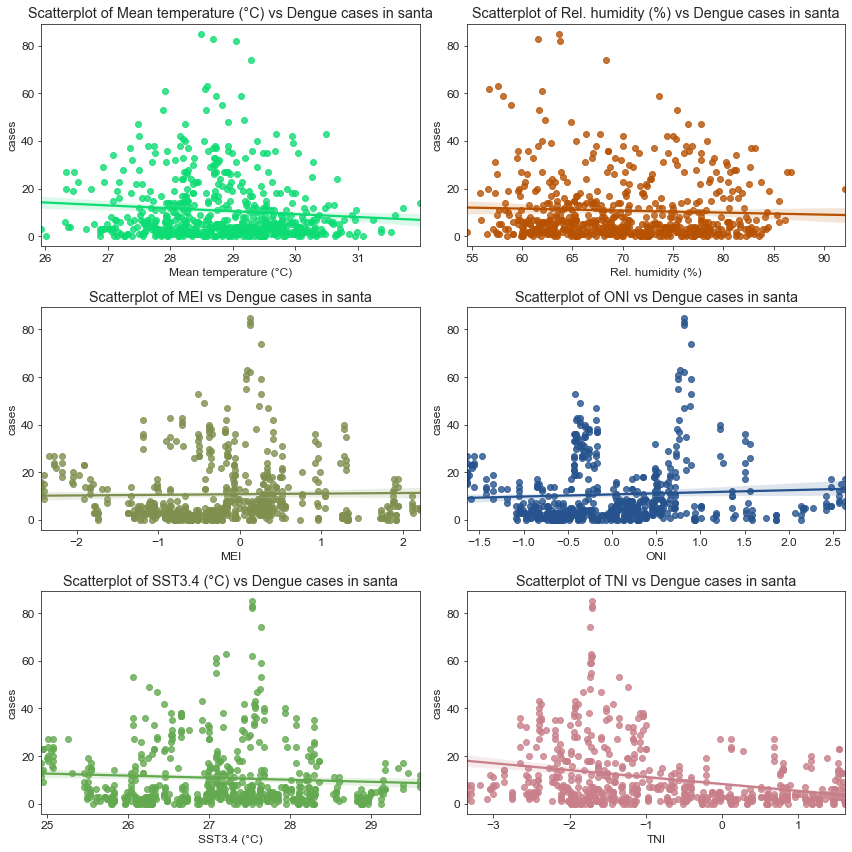

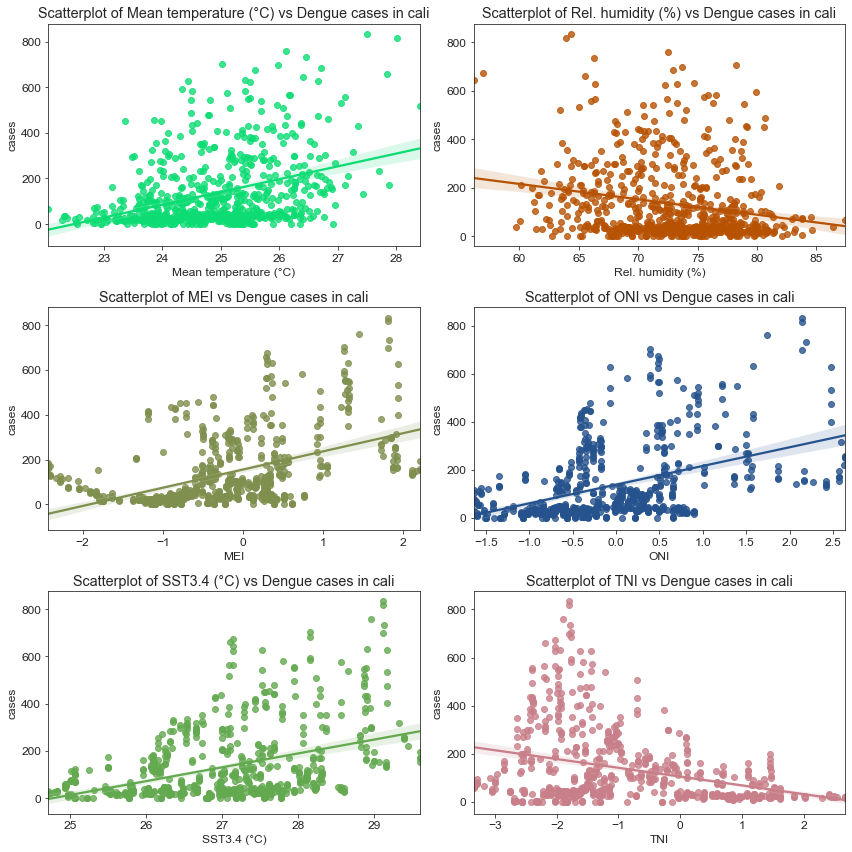

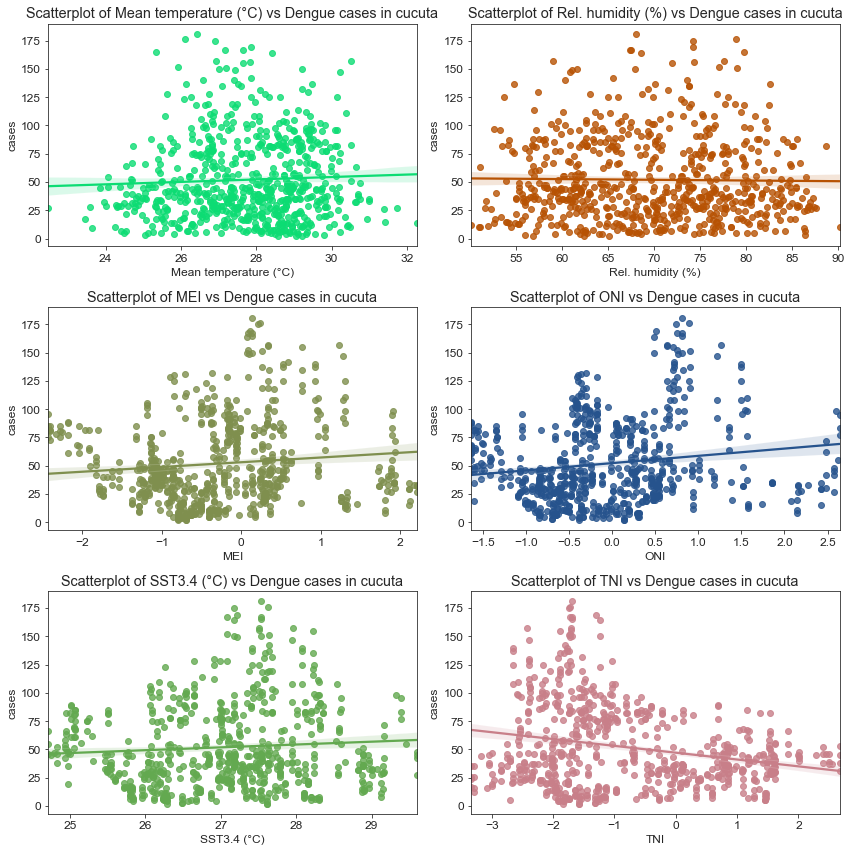

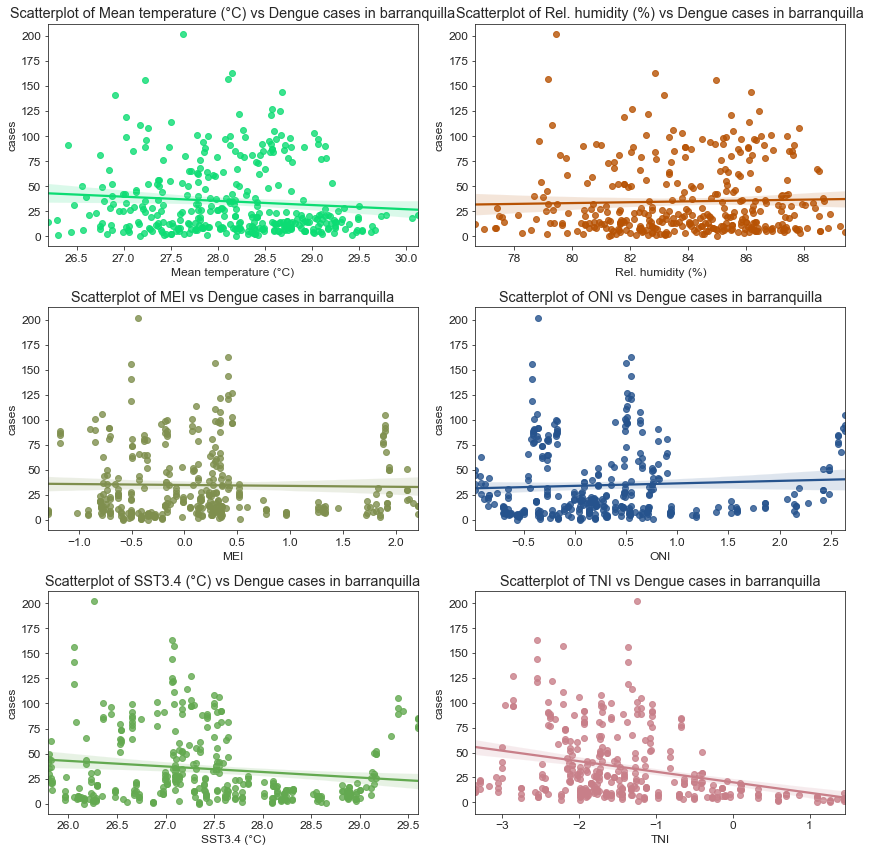

In [57]:
for n in municipios:
    df = dataframes[n]
    fig, axes = plt.subplots(3,2, figsize=(12,12))
    axes = axes.flatten()
    vars_to_plot = ["TEMPERATURE_MEAN","REL_HUMIDITY_MEAN","MEI","ONI","SST3.4","TNI"]
    xlabels  = ["Mean temperature (°C)","Rel. humidity (%)", "MEI", "ONI", "SST3.4 (°C)", "TNI"]
    colors = list(mcolors.get_named_colors_mapping().keys())[99:105]
    for i,var in enumerate(vars_to_plot):
        sns.regplot(x = df[var], y = df["DENGUE"], ax = axes[i], color = colors[i])
        axes[i].set_title("Scatterplot of "+xlabels[i]+" vs Dengue cases in " + n)
        axes[i].set_ylabel("cases")
        axes[i].set_xlabel(xlabels[i])
    plt.tight_layout()

# CORRELATION OVER THE YEARS WITH DELAYS BETWEEN THE COVARIATES AND THE DENGUE CASES

In [27]:
for n in municipios:
    dataframes[n]["MES"] = dataframes[n].index.month

In order to calculate the correlation of dengue with the lagged covariates a function was created. This function guarantees that a correlation is calculated for each meteorological variable for a specific number of lags against dengue (`lag_size`).  

This function lags the meteorological covariate, but does not lag the dengue variable, and according to this data it calculates the respective correlation over time.

In [28]:
dataframes['barranquilla']

,COD_DPTO,COD_MUNICIPIO,POBLACION,ANO,SEMANA,PRECIPITATION,DRY_DAYS,TEMPERATURE_AMAX,REL_HUMIDITY_AMAX,TEMPERATURE_AMIN,...,ONI,SST1+2,SST3,SST4,SST3.4,TNI,DENGUE,DENGUE GRAVE,MORTALIDAD POR DENGUE,MES
FECHA,,,,,,,,,,,,,,,,,,,,,
2013-06-30,8,8001,1206946.0,2013,27,0.0,5,34.4,99.0,24.6,...,-0.380000,20.290000,24.970000,28.760000,26.910000,-2.398000,91,5,0,6
2013-07-07,8,8001,1206946.0,2013,28,0.0,7,34.7,99.0,24.2,...,-0.380000,20.290000,24.970000,28.760000,26.910000,-2.398000,101,4,0,7
2013-07-14,8,8001,1206946.0,2013,29,0.0,7,36.0,99.0,23.2,...,-0.380000,20.290000,24.970000,28.760000,26.910000,-2.398000,90,0,0,7
2013-07-21,8,8001,1206946.0,2013,30,20.0,6,35.0,99.0,24.0,...,-0.380000,20.290000,24.970000,28.760000,26.910000,-2.398000,78,2,0,7
2013-07-28,8,8001,1206946.0,2013,31,6.3,5,35.1,99.0,23.7,...,-0.367143,20.020000,24.742857,28.738571,26.751429,-2.306714,84,1,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-03-15,8,8001,1239518.0,2020,12,0.3,6,33.1,95.0,24.0,...,0.490000,27.110000,27.430000,29.220000,27.820000,-1.811000,0,0,0,3
2020-03-22,8,8001,1239518.0,2020,13,0.0,7,34.2,98.0,24.1,...,0.490000,27.110000,27.430000,29.220000,27.820000,-1.811000,0,0,0,3
2020-03-29,8,8001,1239518.0,2020,14,0.0,7,33.6,96.0,24.3,...,0.370000,26.475714,27.761429,29.260000,28.105714,-1.785960,0,0,0,3


In [29]:
promedios_dict = {}
desv_esta_dict = {}
for n in municipios:
    df = dataframes[n]

    promedios_mensuales = df.groupby(df.MES).mean().reset_index()
    desv_esta_mensuales = df.groupby(df.MES).std().reset_index()

#promedios_mensuales = promedios_mensuales.rename(columns={'index': 'SEMANA'})
#desv_esta_mensuales = desv_esta_mensuales.rename(columns={'index': 'SEMANA'})

    promedios_mensuales = promedios_mensuales[df.columns]
    desv_esta_mensuales = desv_esta_mensuales[df.columns]
    promedios_dict[n] = promedios_mensuales
    desv_esta_dict[n] = desv_esta_mensuales

In [30]:
dataframes_norm = dataframes.copy()

for n in municipios:
    prom = promedios_dict[n].values[:,0:]
    std = desv_esta_dict[n].values[:,0:]
    for i in range(len(dataframes_norm[n])):
        mes = int(dataframes_norm[n].iloc[i,:].MES - 1)
        for j,col in  enumerate(dataframes_norm[n].columns[:-4]):
            dataframes_norm[n].iloc[i,j] = (dataframes_norm[n].iloc[i,j]-prom[mes,j])/std[mes,j]
    #df_norm = df.copy()

<ipython-input-30-c07abdb114ed>:9: RuntimeWarning: invalid value encountered in double_scalars
  dataframes_norm[n].iloc[i,j] = (dataframes_norm[n].iloc[i,j]-prom[mes,j])/std[mes,j]


In [31]:
def lagged_corr(df, weeks, var, window):
    return df[str(var)].shift(periods=weeks).iloc[weeks:].corr(df['DENGUE'].iloc[weeks:], min_periods=window)

                                                        
cols = ['PRECIPITATION', 'DRY_DAYS', 'TEMPERATURE_AMAX', 'REL_HUMIDITY_AMAX',
       'TEMPERATURE_AMIN', 'REL_HUMIDITY_AMIN', 'TEMPERATURE_MEAN',
       'TEMPERATURE_RANGE', 'REL_HUMIDITY_MEAN', 'MEI', 'ONI', 'SST1+2',
       'SST3', 'SST4', 'SST3.4', 'TNI', 'DENGUE']
df_corr_melt = {}
for n in municipios:
    fd = dataframes[n]
    df_corr_melt[n] = pd.melt(df.reset_index().reset_index(), id_vars='index', value_vars=cols)

The variables are kept to 24 lags, because after this period of time, usually the behavior starts repeating itself. This filter allows us to reduce the noise in the data.

In [32]:
df_corr_melt['villavicencio']

,index,variable,value
0,0,PRECIPITATION,-0.384103
1,1,PRECIPITATION,-0.603802
2,2,PRECIPITATION,-0.836816
3,3,PRECIPITATION,-0.836816
4,4,PRECIPITATION,1.533269
...,...,...,...
6914,402,DENGUE,439.000000
6915,403,DENGUE,356.000000
6916,404,DENGUE,386.000000
6917,405,DENGUE,280.000000


In [33]:
for n in municipios:
    df_corr_melt[n].rename(columns={'index':'lag_size'}, inplace=True)
    df_corr_melt[n] = df_corr_melt[n][(df_corr_melt[n]["lag_size"]<=16)&(df_corr_melt[n]["lag_size"]>2)]
    
df_corr_melt['villavicencio']

,lag_size,variable,value
3,3,PRECIPITATION,-0.836816
4,4,PRECIPITATION,1.533269
5,5,PRECIPITATION,0.169850
6,6,PRECIPITATION,-0.426778
7,7,PRECIPITATION,1.413765
...,...,...,...
6524,12,DENGUE,28.000000
6525,13,DENGUE,35.000000
6526,14,DENGUE,38.000000
6527,15,DENGUE,37.000000


In [34]:
for n in municipios:
    df_corr_melt[n]['corr'] = df_corr_melt[n].apply(lambda x: lagged_corr(dataframes_norm[n], x.lag_size,
                                                          x.variable, 200), axis=1)

<ipython-input-34-488816fa51fe>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_corr_melt[n]['corr'] = df_corr_melt[n].apply(lambda x: lagged_corr(dataframes_norm[n], x.lag_size,


In [35]:
df_corr_pivot = {}
columns = {}
row_max = {}
for n in municipios:
    df_corr_pivot[n] = df_corr_melt[n].pivot_table(columns='lag_size', index='variable', values='corr')
    row_max[n] = np.abs(df_corr_pivot[n]).idxmax(axis=1)
    columns[n] = row_max[n].index

In [36]:
df_corr_pivot['villavicencio']

lag_size,3,4,5,6,7,8,9,10,11,12,13,14,15,16
variable,,,,,,,,,,,,,,
DENGUE,0.917056,0.899226,0.867181,0.846705,0.818648,0.791628,0.758851,0.730307,0.699984,0.669098,0.636758,0.603974,0.575204,0.548220
DRY_DAYS,0.070496,0.082036,0.062998,0.067973,0.071261,0.071856,0.068913,0.087163,0.073201,0.076810,0.089113,0.100075,0.108635,0.103989
MEI,0.164216,0.167900,0.172038,0.176641,0.179028,0.181970,0.185375,0.189558,0.191381,0.192814,0.190893,0.191127,0.188246,0.185464
ONI,0.176277,0.180862,0.184582,0.189376,0.193499,0.195360,0.196659,0.199260,0.201785,0.203469,0.204102,0.206961,0.206725,0.207663
PRECIPITATION,0.037568,0.020214,0.038348,0.039015,0.015991,0.014270,0.013570,0.010000,0.003977,-0.002459,-0.005350,-0.012977,-0.027657,-0.025568
REL_HUMIDITY_AMAX,-0.017757,-0.020968,-0.013483,-0.011484,-0.005471,0.014828,0.018427,0.016482,0.026968,0.043058,0.052722,0.046941,0.048013,0.053889
REL_HUMIDITY_AMIN,-0.099517,-0.088307,-0.076708,-0.088363,-0.084911,-0.086071,-0.087653,-0.094961,-0.074914,-0.074970,-0.073082,-0.075104,-0.073497,-0.084206
REL_HUMIDITY_MEAN,0.049622,0.043336,0.051872,0.042763,0.042742,0.038335,0.026155,0.017795,0.030942,0.034443,0.024796,0.017720,0.014404,0.009235
SST1+2,-0.178245,-0.171208,-0.165139,-0.159566,-0.156822,-0.149090,-0.135117,-0.121611,-0.114519,-0.107931,-0.096048,-0.082818,-0.081009,-0.062599


In [37]:
df_corr_melt['villavicencio'].variable.unique()

array(['PRECIPITATION', 'DRY_DAYS', 'TEMPERATURE_AMAX',
       'REL_HUMIDITY_AMAX', 'TEMPERATURE_AMIN', 'REL_HUMIDITY_AMIN',
       'TEMPERATURE_MEAN', 'TEMPERATURE_RANGE', 'REL_HUMIDITY_MEAN',
       'MEI', 'ONI', 'SST1+2', 'SST3', 'SST4', 'SST3.4', 'TNI', 'DENGUE'],
      dtype=object)

In [38]:
df_corr_melt_sub = {}
for n in municipios:
    df_corr_melt_sub[n] = df_corr_melt[n][df_corr_melt[n]['variable']\
                                      .isin(('MEI', 'ONI', 'SST1+2', 'SST3', 'SST4', 'SST3.4', 'TNI'))]
# df_corr_melt_sub

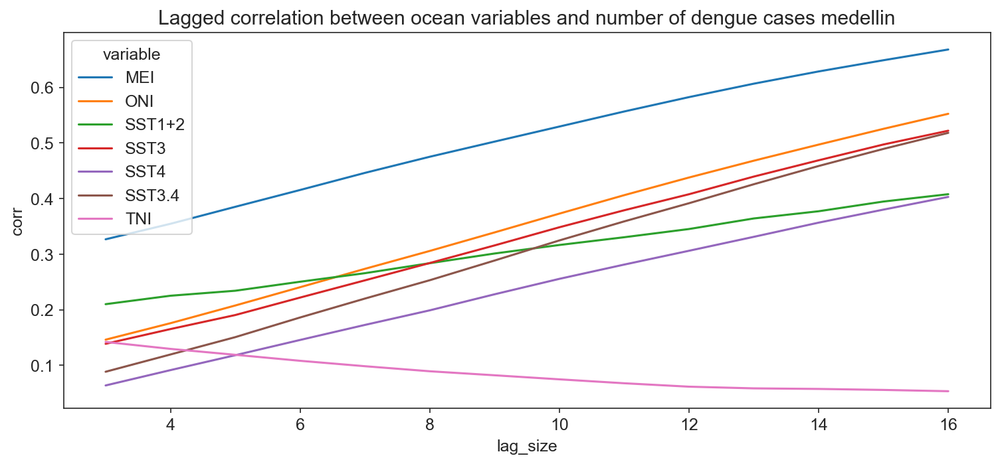

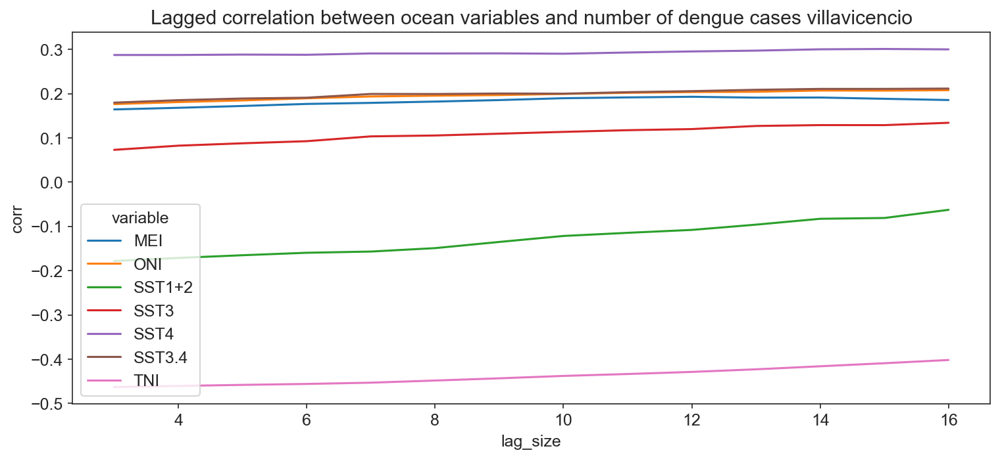

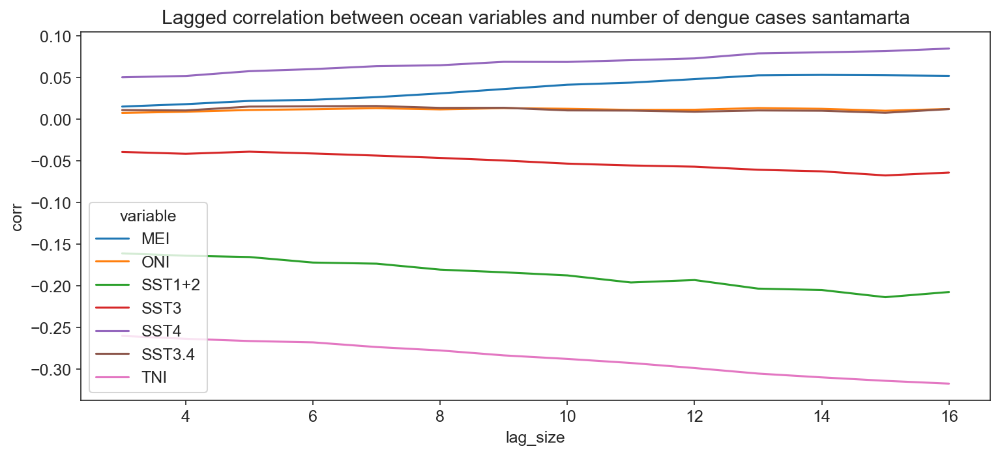

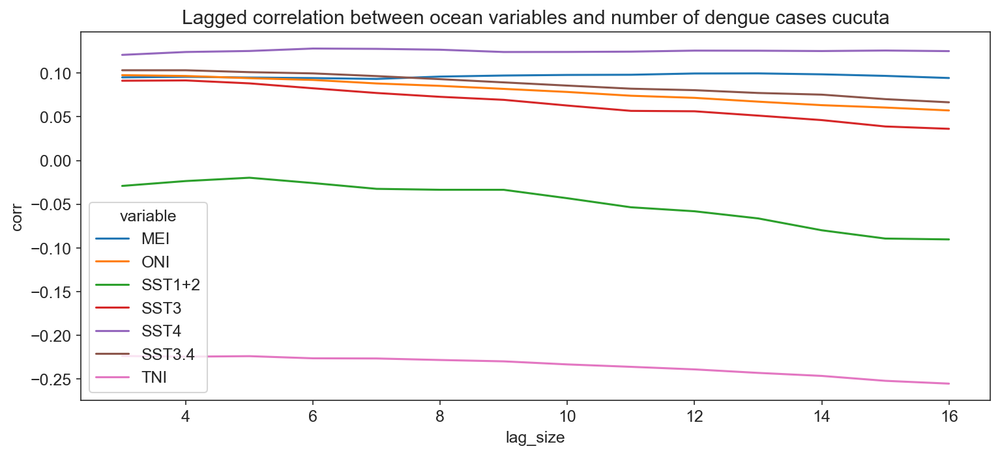

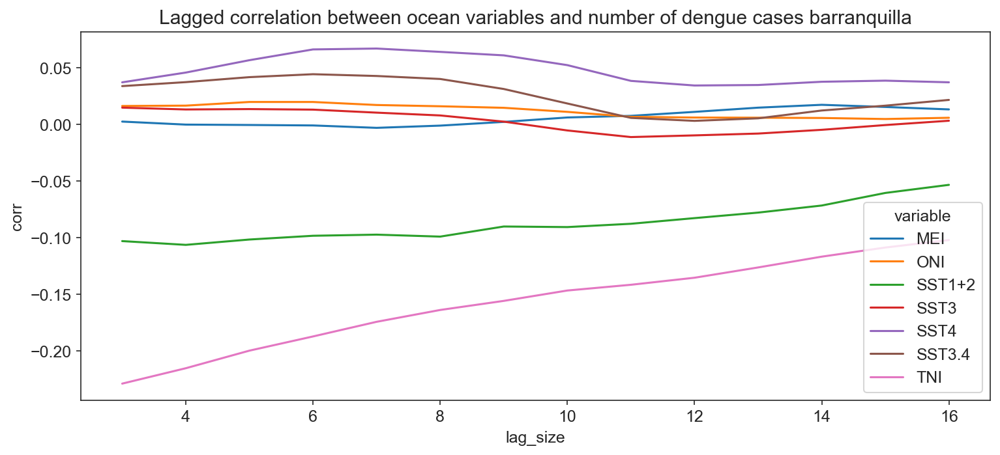

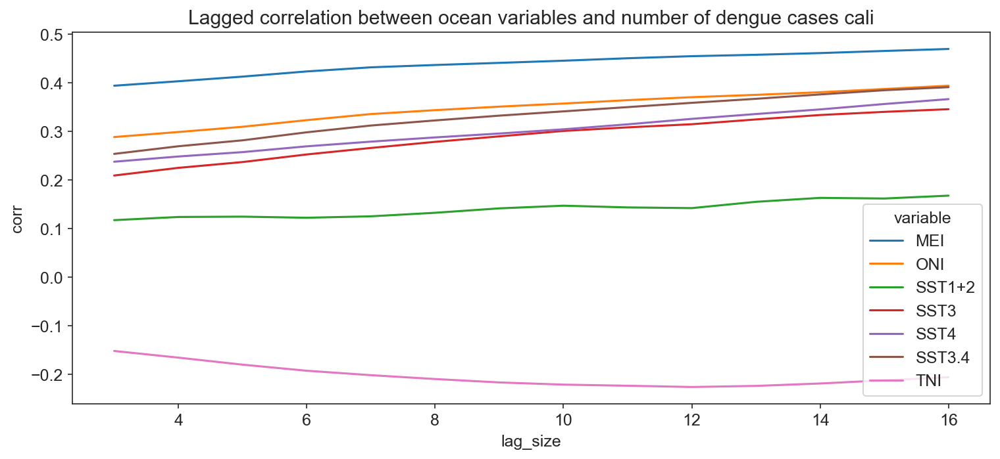

In [39]:
for n in municipios:
    fig, axs = plt.subplots(figsize = (12,5), dpi=150)
    ax = sns.lineplot(x='lag_size', y='corr', data=df_corr_melt_sub[n], hue = 'variable')\
                    .set_title('Lagged correlation between ocean variables and number of dengue cases ' + n)

In [40]:
df_corr_melt_sub3 = {}
for n in municipios:
    df_corr_melt_sub3[n] = df_corr_melt[n][df_corr_melt[n]['variable'] == 'DENGUE']
# df_corr_melt_sub3

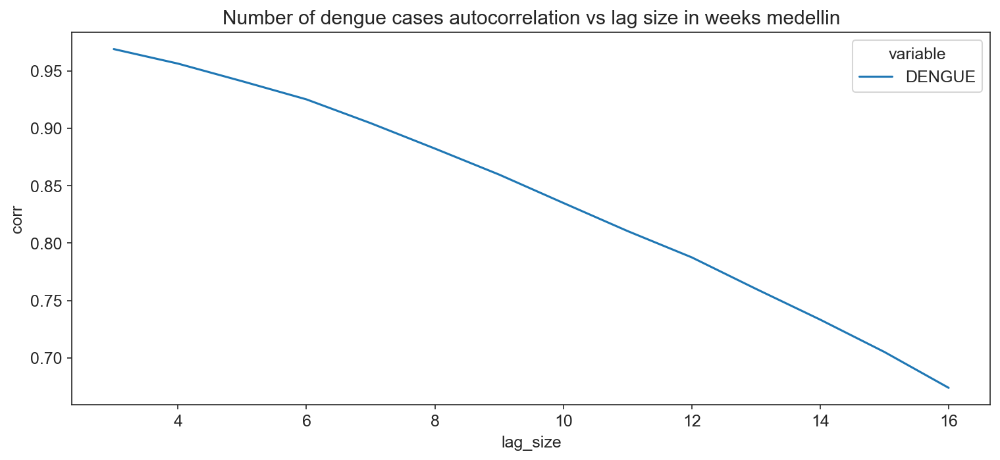

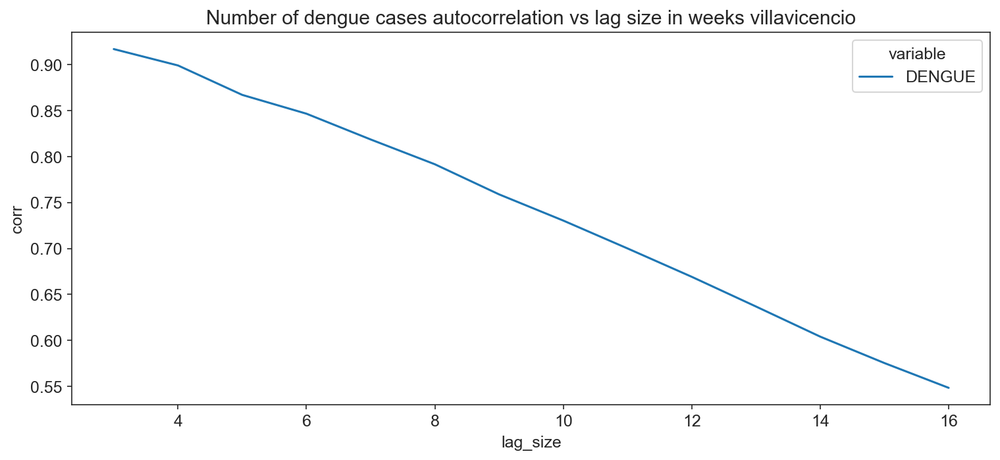

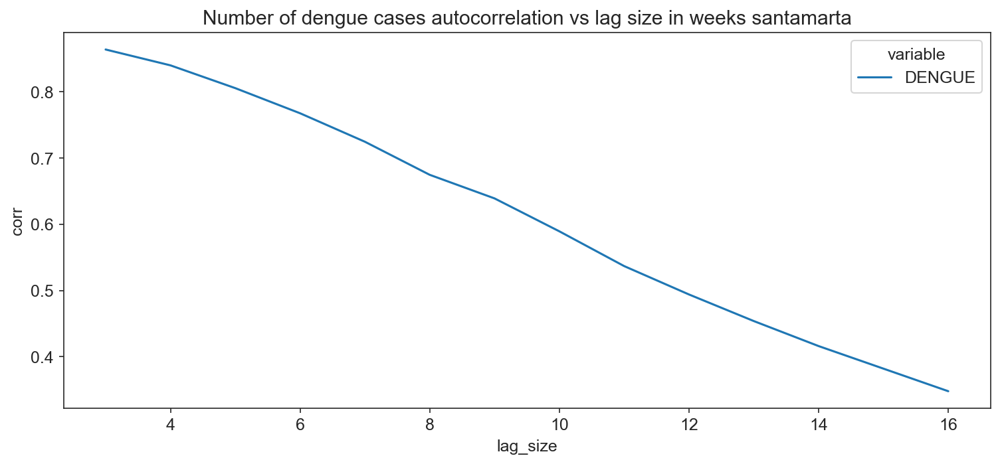

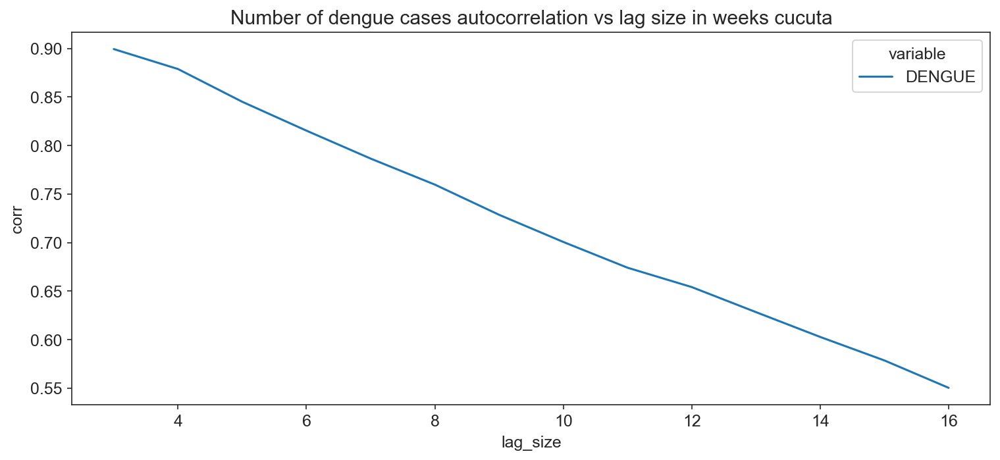

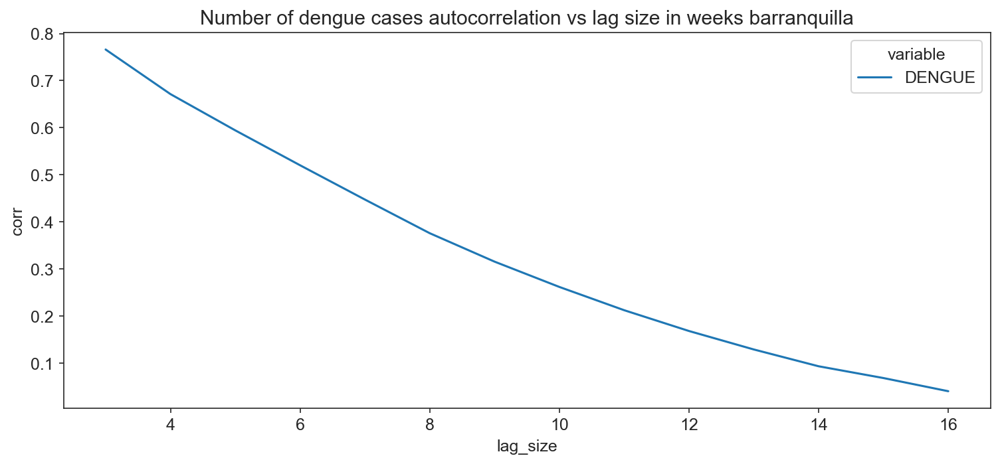

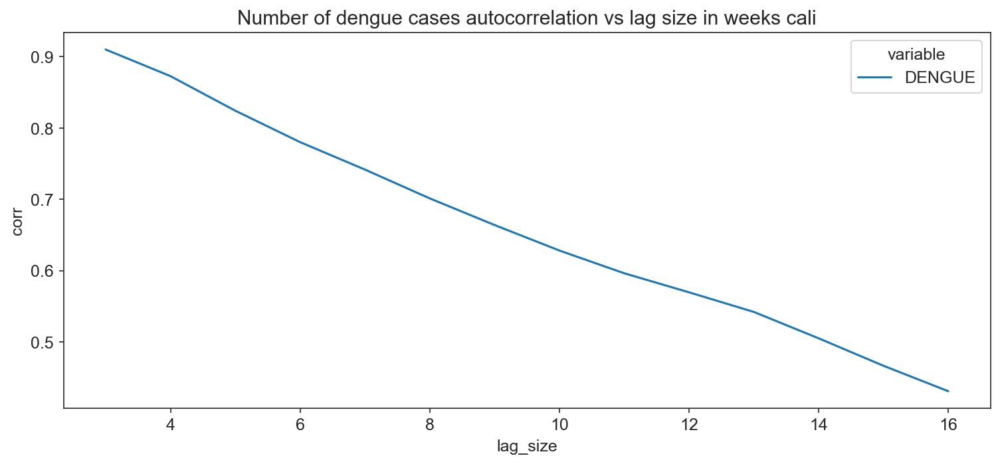

In [41]:
for n in municipios:
    fig, axs = plt.subplots(figsize = (12,5), dpi=150)
    ax = sns.lineplot(x='lag_size', y='corr', data=df_corr_melt_sub3[n], hue = 'variable')\
                .set_title('Number of dengue cases autocorrelation vs lag size in weeks ' + n)

In [42]:
df_corr_melt_sub2 = {}
for n in municipios:
    df_corr_melt_sub2[n] = df_corr_melt[n][df_corr_melt[n]['variable'].isin(('TEMPERATURE_MEAN', 'REL_HUMIDITY_MEAN', 'PRECIPITATION'))]
# df_corr_melt_sub2

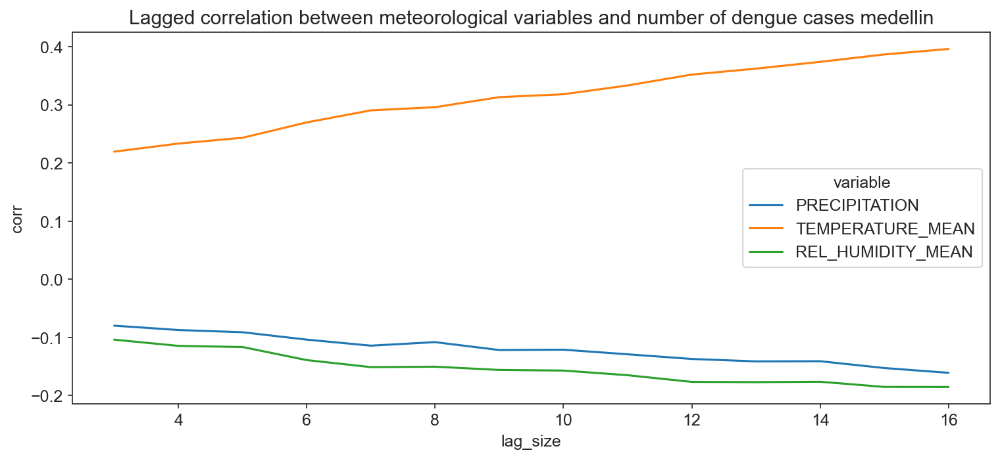

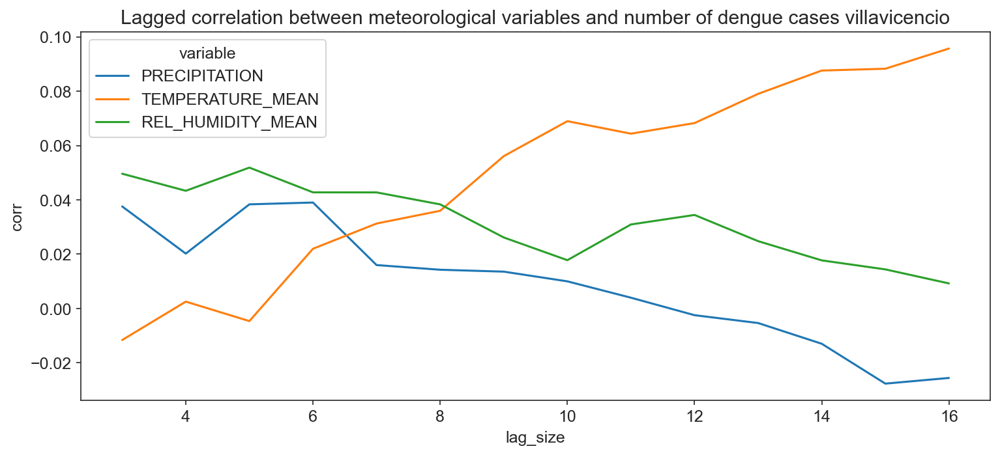

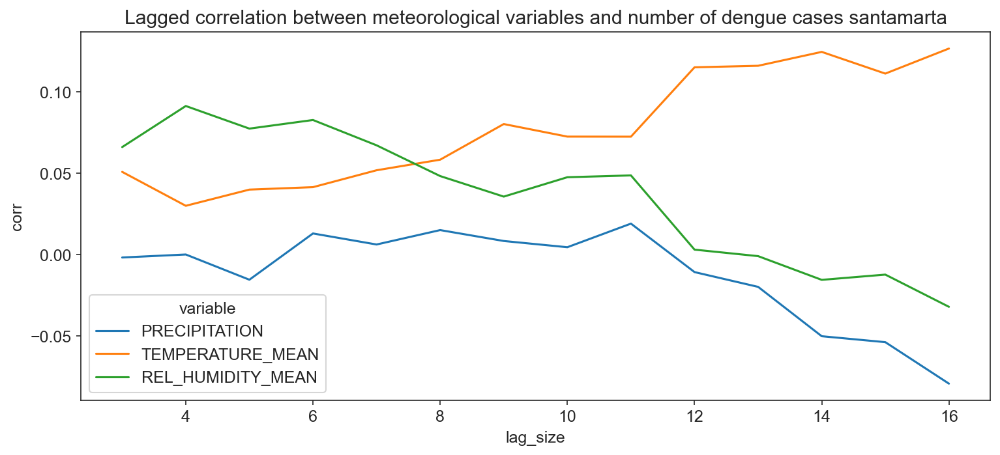

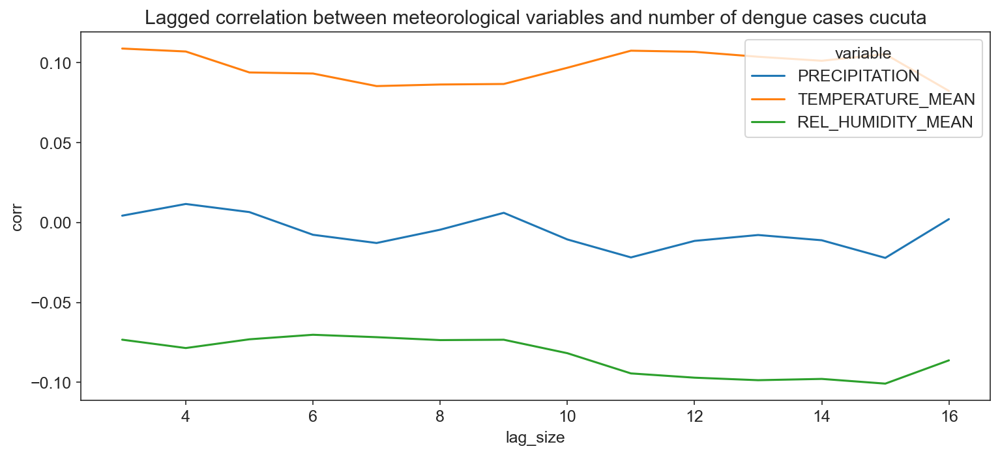

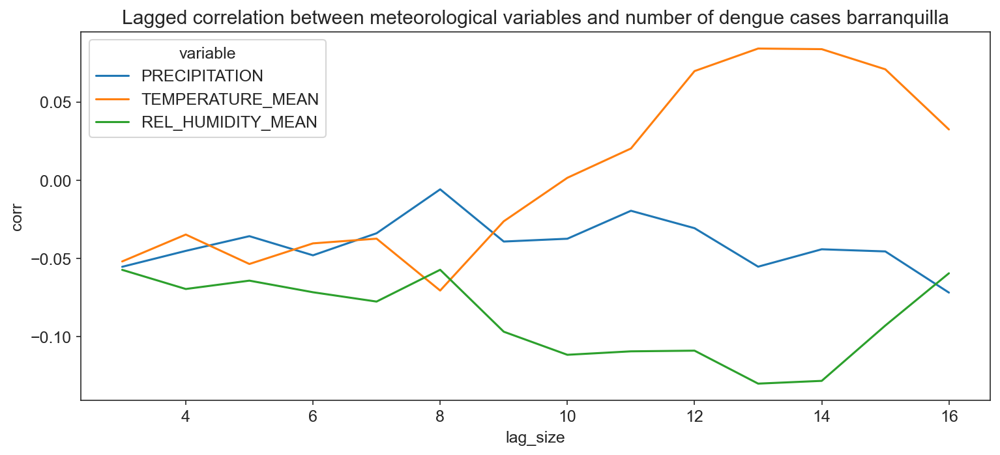

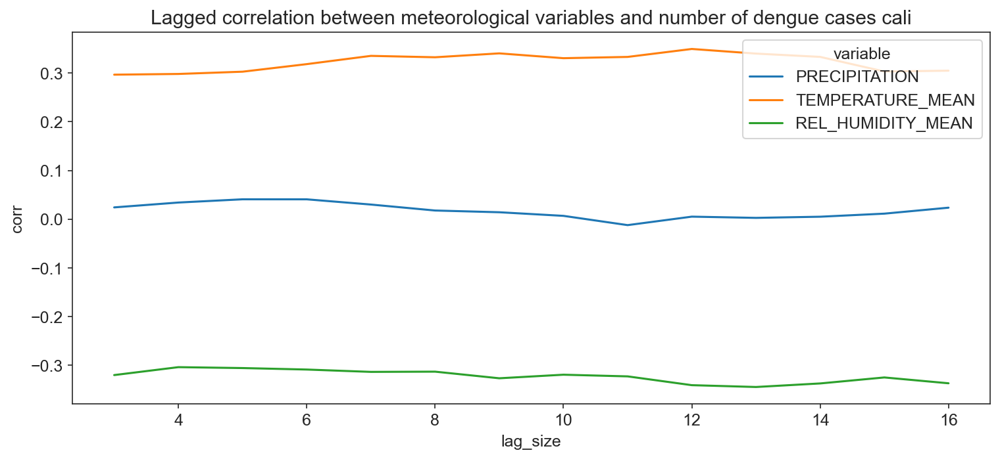

In [43]:
for n in municipios:
    fig, axs = plt.subplots(figsize = (12,5), dpi=150)
    ax = sns.lineplot(x='lag_size', y='corr', data=df_corr_melt_sub2[n], hue = 'variable')\
                    .set_title('Lagged correlation between meteorological variables and number of dengue cases ' + n)

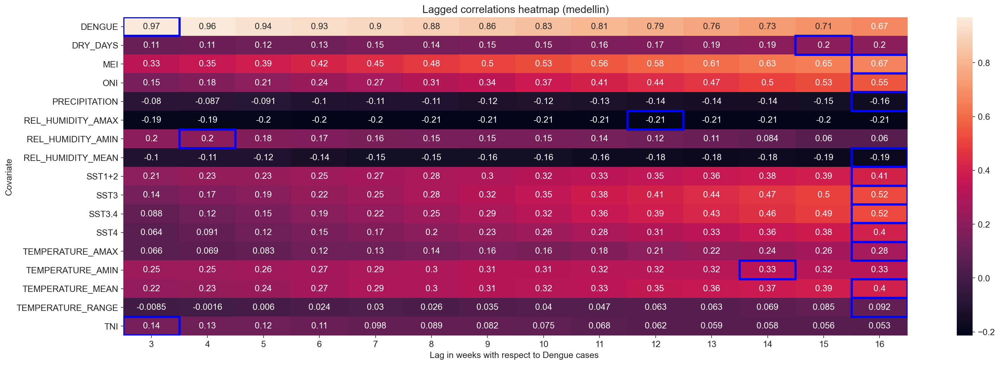

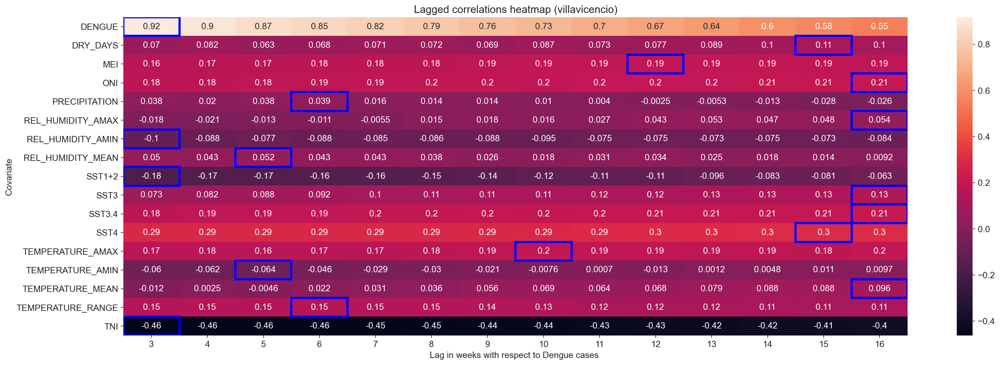

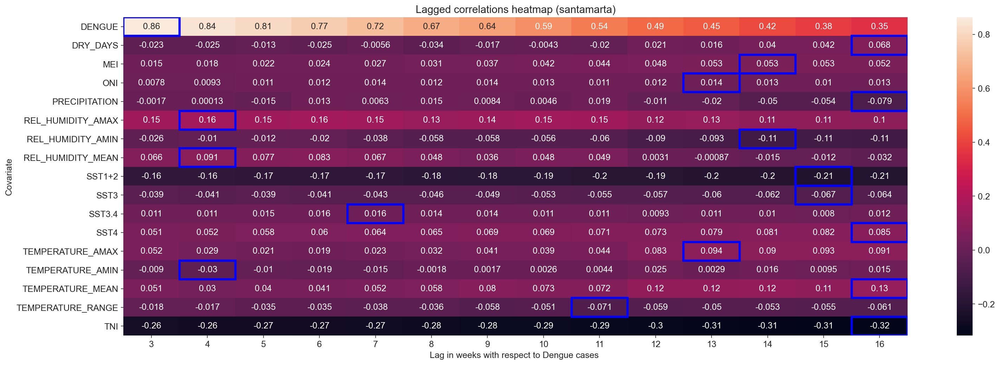

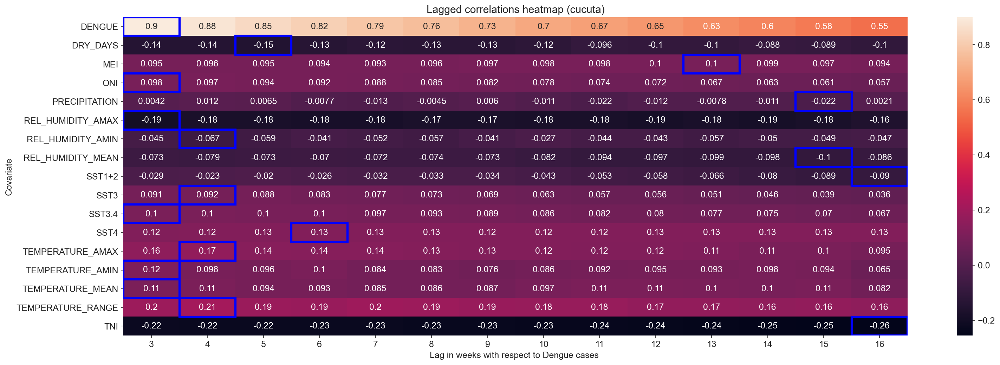

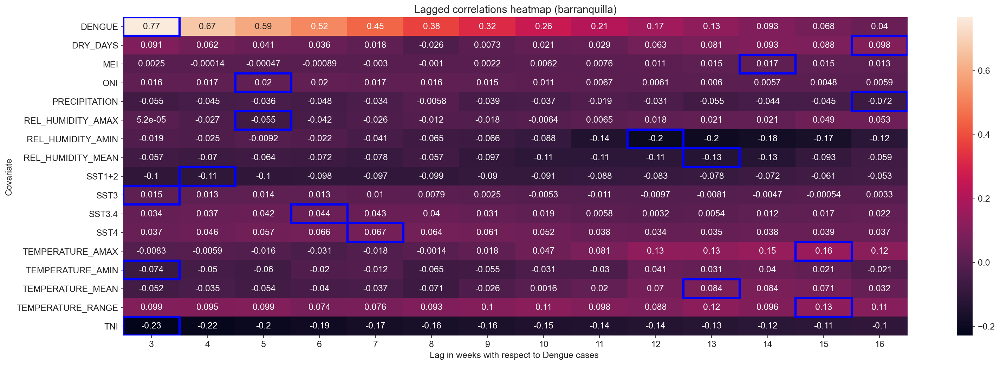

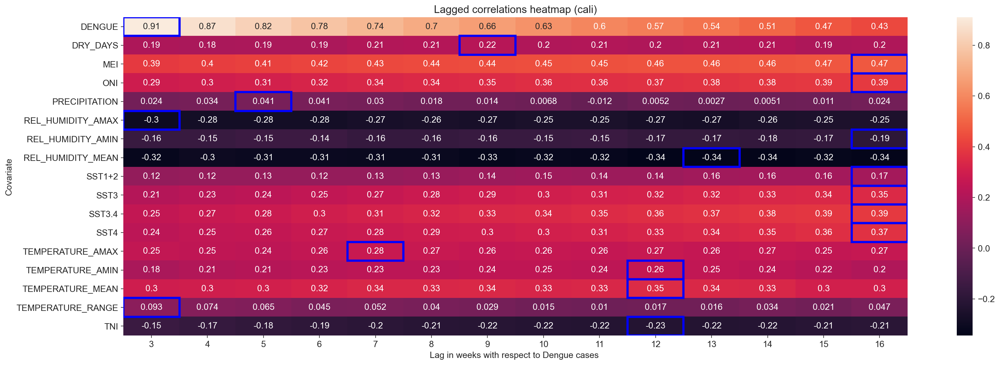

In [44]:
for n in municipios:
    fig, ax = plt.subplots(1,1, figsize=(24,8), dpi = 150)
    sns.heatmap(df_corr_pivot[n], annot = True, ax = ax)
    ax.set_xlabel("Lag in weeks with respect to Dengue cases ")
    ax.set_title("Lagged correlations heatmap ({})".format(n))
    ax.set_ylabel("Covariate");
    for row, index in enumerate(columns[n]):
        position = df_corr_pivot[n].columns.get_loc(row_max[n][index])
        ax.add_patch(Rectangle((position, row),1,1, fill=False, edgecolor='blue', lw=3))


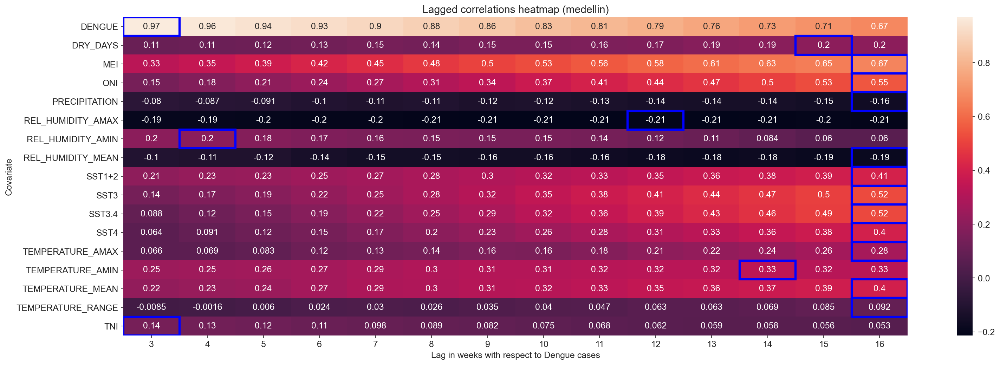

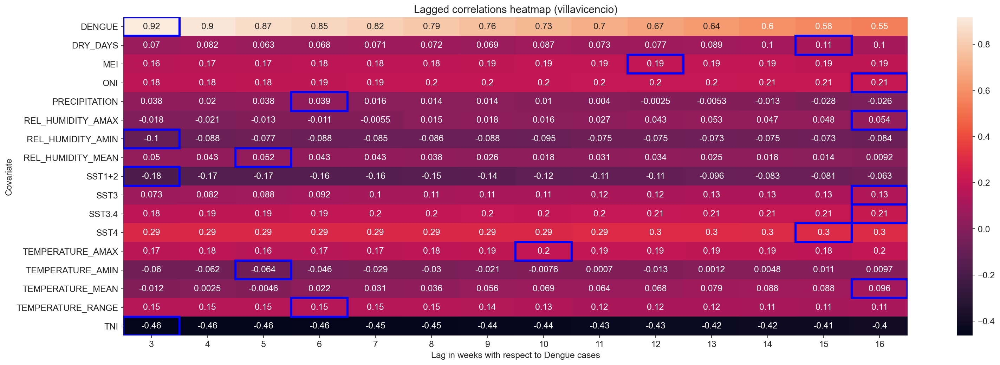

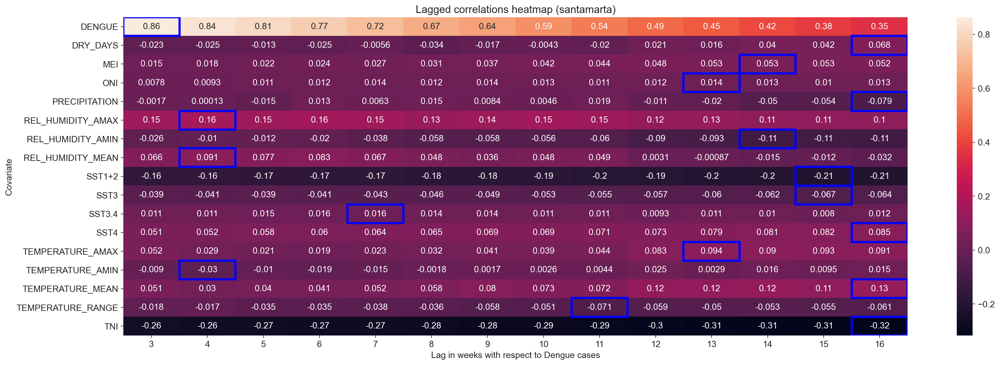

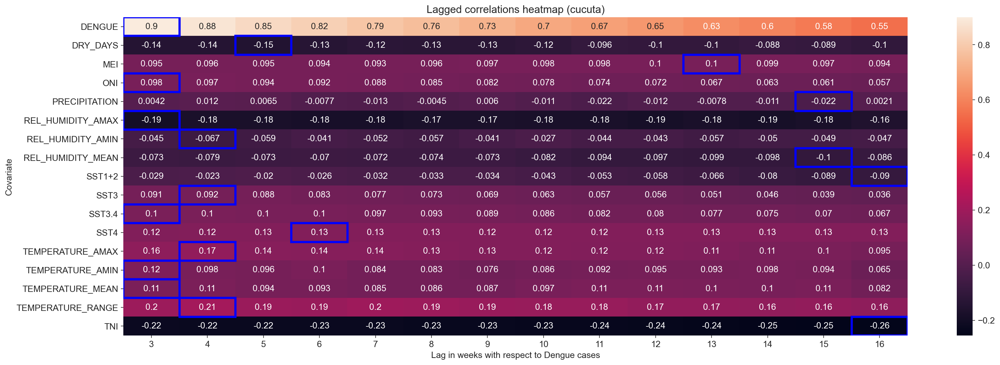

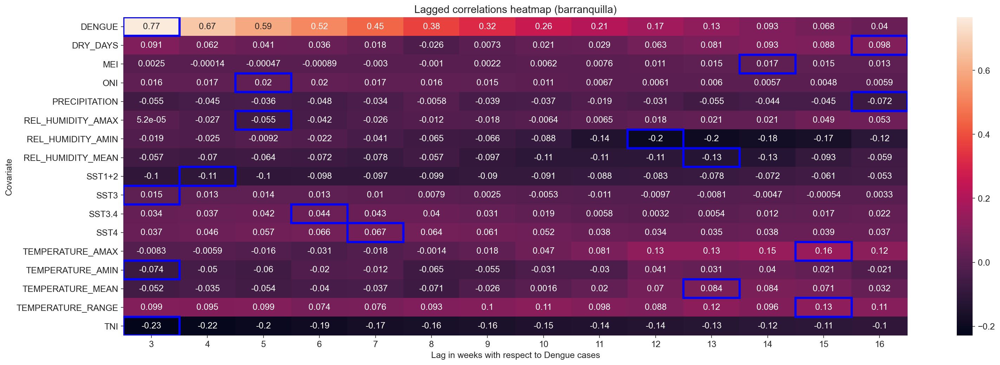

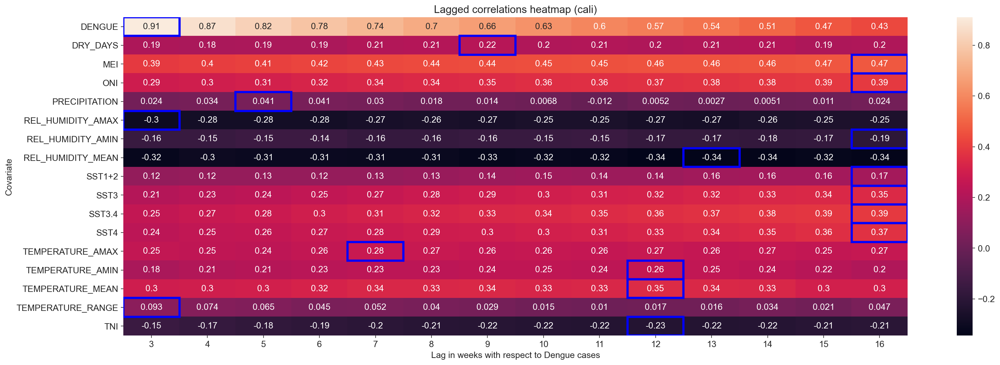

In [45]:
for n in municipios:
    fig, ax = plt.subplots(1,1, figsize=(24,8), dpi = 150)
    sns.heatmap(df_corr_pivot[n], annot = True, ax = ax)
    ax.set_xlabel("Lag in weeks with respect to Dengue cases")
    ax.set_title("Lagged correlations heatmap ({})".format(n))
    ax.set_ylabel("Covariate");
    for row, index in enumerate(columns[n]):
        position = df_corr_pivot[n].columns.get_loc(row_max[n][index])
        ax.add_patch(Rectangle((position, row),1,1, fill=False, edgecolor='blue', lw=3))


The following function is done with the purpose of calculating the correlation between the meteorological variables and the lagged dengue, this variable is lagged up to 17 times and the `phases_confirmed` dataframe shows the result of this calculations.

In [46]:
def obtener_conjunto_desfasado(datos,meses_desfase):
    dat_desfase = datos.copy().reset_index(drop=True)
    for i in range(len(dat_desfase)-meses_desfase):
        dat_desfase.loc[i,"DENGUE_UNPHASED"] = dat_desfase.loc[i+meses_desfase,"DENGUE"]
    quitar_filas = list(range(len(dat_desfase)-meses_desfase,len(dat_desfase)))
    dat_desfase= dat_desfase.drop(dat_desfase.index[quitar_filas])
    return dat_desfase

In [47]:
phases_confirmed = {}
for n in municipios:
    df_for_corr_2 = df_for_corr[n][cols]
    phases = [obtener_conjunto_desfasado(df_for_corr_2, i).corr(method='pearson').iloc[:,-1:] for i in range(17)]
    phases_confirmed[n] = pd.concat(phases, axis = 1)

In [48]:
phases_confirmed['medellin']

,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED,DENGUE_UNPHASED
PRECIPITATION,-0.061515,-0.067692,-0.071593,-0.077752,-0.086124,-0.083727,-0.088711,-0.096898,-0.089182,-0.098324,-0.097284,-0.102747,-0.108583,-0.113457,-0.115210,-0.130088,-0.140299
DRY_DAYS,0.088452,0.092050,0.087269,0.092636,0.097621,0.095133,0.097750,0.112907,0.101870,0.112858,0.115499,0.120947,0.127604,0.145902,0.156503,0.173107,0.176527
TEMPERATURE_AMAX,0.043609,0.053948,0.073726,0.088205,0.097055,0.108238,0.136903,0.151140,0.159993,0.181887,0.184081,0.207246,0.229504,0.246156,0.264673,0.288197,0.300569
REL_HUMIDITY_AMAX,-0.164897,-0.168158,-0.167105,-0.172697,-0.169904,-0.162673,-0.164539,-0.161816,-0.161172,-0.164760,-0.164152,-0.162400,-0.164457,-0.162753,-0.167302,-0.170179,-0.179216
TEMPERATURE_AMIN,0.224680,0.240285,0.254479,0.255485,0.264926,0.273630,0.283207,0.303177,0.314476,0.324471,0.320768,0.328531,0.328030,0.326312,0.334219,0.323625,0.324957
REL_HUMIDITY_AMIN,0.279286,0.280781,0.270240,0.266291,0.265678,0.253596,0.236653,0.226594,0.218853,0.203422,0.194634,0.186164,0.167061,0.149005,0.124267,0.092056,0.087303
TEMPERATURE_MEAN,0.212830,0.231569,0.246516,0.253636,0.267014,0.271329,0.289984,0.307470,0.309629,0.321466,0.323905,0.334682,0.345846,0.353866,0.365076,0.375676,0.380148
TEMPERATURE_RANGE,0.042469,0.048466,0.043613,0.046146,0.047343,0.045548,0.051380,0.049089,0.041608,0.043173,0.044617,0.044746,0.055068,0.054756,0.062946,0.077567,0.081270
REL_HUMIDITY_MEAN,-0.100547,-0.102389,-0.101052,-0.100996,-0.104431,-0.096145,-0.105818,-0.111049,-0.103674,-0.101974,-0.101090,-0.104198,-0.109257,-0.109644,-0.112122,-0.122993,-0.121946
MEI,0.224917,0.254416,0.282662,0.309512,0.337175,0.366409,0.395831,0.425159,0.453051,0.478869,0.505240,0.532010,0.558024,0.582970,0.605291,0.626225,0.646312
